In [1]:
using Base.Threads
println("Usando ", nthreads(), " threads 😎")

Usando 15 threads 😎


In [2]:
using Pkg

Pkg.activate("C:/Users/julia/OneDrive/Escritorio/phd/Bacteria_ABM/ABM_CBM/")
Pkg.instantiate()
Pkg.precompile()

  Activating project at `C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM`


In [3]:
import Pkg

Pkg.activate("C:/Users/julia/OneDrive/Escritorio/phd/Bacteria_ABM/ABM_CBM/")
Pkg.instantiate()

# ENV["JULIA_CUDA_USE_BINARYBUILDER"] = false

# using CUDA
# CUDA.set_runtime_version!(v"12.2")

using Revise
using CellBasedModels
using Distributions
using CairoMakie
using JSON
using JLD2

import CairoMakie: Point3f, Cylinder, Sphere, NoShading

CairoMakie.activate!()

  Activating project at `C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM`


In [13]:
function plotAgents3D!(ax, x, y, z, d, l, theta, phi, p; colormap=:inferno, kargs...)
    # Recomendado: en tu Axis3 usa aspect=:data para evitar distorsión de ejes
    # ej.: ax = Axis3(fig[1,1]; aspect=:data)

    for (xi, yi, zi, di, li, thetai, phii, pi) in zip(x, y, z, d, l, theta, phi, p)
        # Dirección unitaria u(θ,φ)
        ux = cos(thetai) * cos(phii)
        uy = sin(thetai) * cos(phii)
        uz = sin(phii)

        # Polos (extremos)
        x_plus  = xi + 0.5 * li * ux
        y_plus  = yi + 0.5 * li * uy
        z_plus  = zi + 0.5 * li * uz

        x_minus = xi - 0.5 * li * ux
        y_minus = yi - 0.5 * li * uy
        z_minus = zi - 0.5 * li * uz

        r = Float32(di/2)

        # Color: usa tu escalar 'pi' con colormap (fija un rango 0..1; ajusta si necesitas)
        colorrange = (0.0, 1.0)
        # Cilindro que UNE los polos (Makie lo orienta solo con p1->p2)


        # Esferas en los polos
        mesh!(ax, Sphere(Point3f(x_plus,  y_plus,  z_plus),  r);
             color=pi, colormap=colormap, colorrange=colorrange, kargs...)
        mesh!(ax, Sphere(Point3f(x_minus, y_minus, z_minus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kargs...)
        mesh!(ax, Cylinder(
            Point3f(x_minus, y_minus, z_minus),
            Point3f(x_plus,  y_plus,  z_plus),
            r);
            color=pi, colormap=colormap, colorrange=colorrange, kargs...)


    end
    return
end


plotAgents3D! (generic function with 1 method)

In [14]:
# using GeometryBasics, Makie

view_dir(az, el) = Vec3f(cos(az)*cos(el), sin(az)*cos(el), sin(el))

function painter_perm(ax::Axis3, x, y, z)
    az = ax.azimuth[]; el = ax.elevation[]
    v  = view_dir(az, el)
    depths = x .* v[1] .+ y .* v[2] .+ z .* v[3]
    sortperm(depths; rev=false)  # far → near (lejos → cerca)
end

function plotAgents3D_auto!(ax, x, y, z, d, l, theta, phi, p; colormap=:inferno, colorrange=(0,1), kwargs...)
    perm = painter_perm(ax, x, y, z)
    for i in perm
        xi, yi, zi = x[i], y[i], z[i]
        di, li = d[i], l[i]
        thetai, phii, pi = theta[i], phi[i], p[i]

        ux = cos(thetai) * cos(phii)
        uy = sin(thetai) * cos(phii)
        uz = sin(phii)

        x_plus  = xi + 0.5li*ux; y_plus  = yi + 0.5li*uy; z_plus  = zi + 0.5li*uz
        x_minus = xi - 0.5li*ux; y_minus = yi - 0.5li*uy; z_minus = zi - 0.5li*uz
        r = Float32(di/2)

        mesh!(ax, Sphere(Point3f(x_plus,  y_plus,  z_plus),  r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)
        mesh!(ax, Sphere(Point3f(x_minus, y_minus, z_minus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)
        mesh!(ax, Cylinder(Point3f(x_minus, y_minus, z_minus), Point3f(x_plus, y_plus, z_plus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)

    end
    return
end


function plotAgents3Drod!(ax, x, y, z, d, l, theta, phi, p; colormap=:inferno, colorrange=(0,1), kwargs...)
    perm = painter_perm(ax, x, y, z)
    for i in perm
        xi, yi, zi = x[i], y[i], z[i]
        di, li = d[i], l[i]
        thetai, phii, pi = theta[i], phi[i], p[i]

        ux = cos(thetai) * cos(phii)
        uy = sin(thetai) * cos(phii)
        uz = sin(phii)

        x_plus  = xi + 0.5li*ux; y_plus  = yi + 0.5li*uy; z_plus  = zi + 0.5li*uz
        x_minus = xi - 0.5li*ux; y_minus = yi - 0.5li*uy; z_minus = zi - 0.5li*uz
        r = Float32(di/2)


        mesh!(ax, Cylinder(Point3f(x_minus, y_minus, z_minus), Point3f(x_plus, y_plus, z_plus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)

    end
    return
end


plotAgents3Drod! (generic function with 1 method)

# Terracing


In [15]:
@inline function rod_poles3d_ordered(x,y,z,l,theta,phi)
    ux,uy,uz = rod_dir3d(theta, phi)
    hx,hy,hz = 0.5l*ux, 0.5l*uy, 0.5l*uz
    return (x+hx, y+hy, z+hz), (x-hx, y-hy, z-hz)  # (+, −)
end

rod_poles3d_ordered (generic function with 1 method)

In [16]:
@inline function rod_dir3d(theta, phi)
    cx = cos(theta); sx = sin(theta)
    cp = cos(phi);   sp = sin(phi)
    return (cx*cp, sx*cp, sp)               # u = (cosθ cosφ, sinθ cosφ, sinφ)
end


rod_dir3d (generic function with 1 method)

In [17]:
rod3D_grow = ABM(3,
    agent = Dict(
            :theta=>Float64,
            :phi =>Float64,
            :d=>Float64,
            :l=>Float64,
            :fx=>Float64,
            :fy=>Float64,
            :fz=>Float64,
            :Wtheta=>Float64,
            :Wphi=>Float64,
            :lTarget => Float64,
            :V => Float64,

        ),    #Local Interaction Parameters

    model = Dict(
            :Ebb =>Float64,
            :eta =>Float64,
            :eps =>Float64,
            :gamma =>Float64,
            :lMax => Float64,
            :σlTarget => Float64,
            :Ebv => Float64,
            :g => Float64,
            :h0 => Float64,
            :Ebp => Float64,
            :alpha_HP =>Float64,
            :K_HP =>Float64,
            :D_HP =>Float64,
            :Kc =>Float64,
            :beta_c =>Float64,
            :D_c =>Float64,
            :c0 =>Float64,
            :gamma_c => Float64,
            :eps_cs =>Float64,
            :gamma_cs =>Float64,
            :D_PGA =>Float64,
            :alpha_PGA =>Float64,
            :KpqC =>Float64,
            :delta_PGA =>Float64,
            :alpha_PhrC =>Float64,
            :alpha_PhrF =>Float64,
            :D_PhrC =>Float64,
            :D_PhrF =>Float64,
            :delta_PhrC =>Float64,
            :delta_PhrF =>Float64,
            :npqC => Int,
            :alpha_V => Float64,
            :delta_V => Float64,
            :beta_V => Float64,
            :KVc => Float64,
            :nV => Int,
            :npc => Int,
            :growth=>Float64,
            :Kpc => Float64,
            :v => Float64,
            :KpqF => Float64,
            :npqF =>Int,



        ),        #Global parameters

    medium = Dict(
            :HPad => Float64,
            :PPad => Float64,
            :c => Float64,
            :PGA => Float64,
            :Hx => Float64,
            :Hy => Float64,
            :PhrF => Float64,
        ),

    agentODE = quote

        fx = 0
        fy = 0
        fz = 0
        Wtheta = 0
        Wphi = 0 

        
        hPad = HPad

        hbac = exp(2*(hPad-z-d/2))
        if hPad>z+d/2
            cbac=c*exp(-gamma_c*(hPad-z-d/2))
            
        else
            cbac=c
        end
        
        dt(l) = l*growth*cbac/(Kc+cbac)
        dt(V)= alpha_V - delta_V*V + beta_V*(hbac)^nV/((KVc)^nV+(hbac)^nV)

        
        

        @loopOverNeighbors i2 begin

            #Use the model provided in the documentation
            Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.repulsiveForces_rods3d_asym(x,y,z,d,l,theta, phi,
                                    x[i2],y[i2],z[i2],d[i2],l[i2],theta[i2], phi[i2], eta, Ebb, 5)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            fz += Fijz
            Wtheta += Wijtheta
            Wphi += Wijphi

   
            
        end

        

        Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.substrateAttraction_rods_yukawa3d(x,y,z,d,l,theta,phi, 
            eta, eps_cs,gamma_cs)

                    #Append the repulsive forces
        fx += Fijx
        fy += Fijy
        fz += Fijz
        Wtheta += Wijtheta
        Wphi += Wijphi   
        
        Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.substrateRepulsion_rods3d(x,y,z,d,l,theta,phi, 
            eta, Ebv)

        #Append the repulsive forces
        fx += Fijx
        fy += Fijy
        fz += Fijz
        Wtheta += Wijtheta
        Wphi += Wijphi   


        fy += -v*Hy/(eta*(l+d))
        fx += -v*Hx/(eta*(l+d))


        Fijx = 0.0; Fijy = 0.0; Fijz = 0.0; Wijtheta=0.0; Wijphi=0.0


         # orientación del rod (tu convención)
        ux =  cos(theta)*cos(phi)
        uy =  sin(theta)*cos(phi)
        uz =  sin(phi)

        # grid spacing
        hx = (simBox[1,2] - simBox[1,1]) / NMedium[1]
        hy = (simBox[2,2] - simBox[2,1]) / NMedium[2]
        Δs_eff = 0.5*min(hx, hy)  # para no saltar celdas


        # recorrer s en [-l/2, l/2]
        K = max(2, ceil(Int, l / Δs_eff))  # aseguras al menos 2
        for s in LinRange(-l/2, l/2, K)
            # punto en el rod
            xp = x + s*ux
            yp = y + s*uy
            zp = z + s*uz

            # celda del pad
            idx = Int(floor(Int, xp/(simBox[1,2]-simBox[1,1])*NMedium[1]) + NMedium[1]/2)
            if mod(xp, (simBox[1,2]-simBox[1,1])/NMedium[1])>0
                idx += 1
            end
            idy = Int(floor(Int, yp/(simBox[2,2]-simBox[2,1])*NMedium[2])+ NMedium[2]/2)
            if mod(yp, (simBox[2,2]-simBox[2,1])/NMedium[2])>0
                idy += 1
            end
            
            # h local del pad (tu altura / “a” local)
            hPad = com.HPad[idx, idy, 1]

            if hPad<zp+d/2
                # fuerza en ese punto (tu función)
                Fx, Fy, Fz, Wθ, Wφ = CBMModels.padRepulsion_rods_point_3d(
                    x, y, z,  # CM bacteria
                    xp, yp, zp,  # punto sobre el rod
                    d, l, theta, phi,
                    eta, Ebp, hPad
                )

                # acumula bacteria
                Fijx += Fx; Fijy += Fy; Fijz += Fz
                Wijtheta += Wθ; Wijphi += Wφ
                com.PPad[idx, idy, 1] += -Fz*eta*(l+d)
            end

        end

        
        fx += Fijx
        fy += Fijy
        fz += Fijz
        Wtheta += Wijtheta
        Wphi += Wijphi   


        ww1 = CBMDistributions.uniform(-1,1)*10^(-6)
        ww2 = CBMDistributions.uniform(-1,1)*10^(-6)

        #Equations
        dt(x) =  fx +ww1
        dt(y) =  fy +ww2
        dt(z) =  fz
        dt(theta) =  Wtheta
        dt(phi) = Wphi
    end,

    agentRule = quote #Bound cells

        #Add division
        if l > lTarget
           

            # Dirección 3D de la varilla (unitaria)
            ux = cos(theta)*cos(phi)
            uy = sin(theta)*cos(phi)
            uz = sin(phi)

            # === Hija A (delantera, +u) ===
            @addAgent(
                x = x + (l+d)/4 * ux,
                y = y + (l+d)/4 * uy,
                z = z + (l+d)/4 * uz,
                l = (l-d)/2,
                # Wtheta = ww1,
                # Wphi= ww2,
                lTarget = CBMDistributions.uniform(lMax-σlTarget, lMax+σlTarget),
            )

            # === Hija B (trasera, −u) ===
            @addAgent(
                x = x - (l+d)/4 * ux,
                y = y - (l+d)/4 * uy,
                z = z - (l+d)/4 * uz,
                l = (l-d)/2,
                # Wtheta = ww1,
                # Wphi= ww2,
                lTarget = CBMDistributions.uniform(lMax-σlTarget, lMax+σlTarget),
            )

            # Elimina célula madre
            @removeAgent()
        end


        
        hPad = HPad
        hbac = c*exp(4*(hPad-z-d/2))
        if hPad >z+d/2
            cbac =c*exp(-gamma_c*(hPad-z-d/2))
        else
            cbac = c
        end
        c += (-l*beta_c*cbac/(Kc+cbac))*dt


        PhrF += (alpha_PhrF)*dt
        PGA += (alpha_PGA*PhrF^npqF/(PhrF^npqF+KpqF^npqF))*dt
        
    end,

    mediumODE=quote 

            
        if @mediumBorder(1,-1) 
            HPad = h0
            c = c[2,i2_]
            PhrF= PhrF[2,i2_]
            PGA=0
        elseif @mediumBorder(1, 1)
            HPad = h0
            c = c[end-1,i2_]
            PhrF= PhrF[end-1,i2_]
            PGA=0

        elseif @mediumBorder(2,-1)
            HPad = h0
            c = c[i1_,2]
            PhrF= PhrF[i1_,2]
            PGA=0

        elseif @mediumBorder(2, 1)
            HPad = h0
            c = c[i1_,end-1]
            PhrF= PhrF[i1_,end-1]
            PGA=0

        else
            dt(HPad) = alpha_HP*PPad - K_HP*(HPad-h0) + D_HP*(@∂2(1,HPad)+@∂2(2,HPad))
            dt(c) =D_c*(@∂2(1,c)+@∂2(2,c))
            dt(PGA) = D_PGA*(@∂2(1,PGA)+@∂2(2,PGA)) - delta_PGA*PGA 
            dt(PhrF) = D_PhrF*(@∂2(1,PhrF)+@∂2(2,PhrF)) - delta_PhrF*PhrF

            Hx = @∂(1,PGA) 
            Hy = @∂(2,PGA)
            
        end
    end,
    # neighborsAlg=CBMNeighbors.VerletDisplacement(skin=4.0, nMaxNeighbors=500),
    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=10),
    mediumAlg=DifferentialEquations.Euler(),
    platform=CPU(),
    agentAlg = CBMIntegrators.Heun()
);


In [92]:
com = Community(rod3D_grow,
            N=2,
            dt=0.0001,
            simBox = [-100 100;-100 100.; -100 100],
            NMedium=[200,200,1],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.Ebb=1* 1.E6 *m/(t^2*d) #Pa
com.eta = 200 *m/(t^2*d) #Pa h
com.eps = 1.E3 *m/(t^2*d) #Pa um^4
com.eps = 0 #Pa um^4
com.gamma=3

com.Ebv = com.Ebb *10 
com.Ebp =  com.Ebb*0.001

com.eps_cs = 5*1.E3 *m/(t^2*d) #Pa um^4
com.gamma_cs=1

com.growth = 2
com.lMax = 5.     
com.σlTarget = 2

com.d = 1.        
com.l[1] = 4.99      
com.l[2] = 2.5      
com.lTarget = 5.  
com.theta[1]=pi/2
com.theta[2]=0
com.x=(com.l+ com.d) ./2 .* cos.(com.theta)
com.y=0
# com.z=com.d/2
# com.phi=0
# com.theta=0
# com.x=0
# com.y=0
com.z=com.d/2
com.phi=0


com.h0=0
com.alpha_HP=300*10^(-6)
com.K_HP=100
com.D_HP=500
com.PPad=0
com.HPad=1


com.PGA=0
# com.alpha_PGA = 10
com.alpha_PGA = 0
com.delta_PGA = 1
com.D_PGA = 5
com.npc = 10
com.v = 2.5*10^9
com.Kpc=0.01

com.KpqC=0.2
com.npqC=4

com.KpqF=0.1
com.npqF=10

com.V=1
com.alpha_V=10
com.delta_V=10
com.beta_V=20
com.KVc=4
com.nV=10


com.D_c = 1000
com.c0 = 1 #Medium concentration
com.c = com.c0 
com.Kc = 1 #Half saturation constant for the medium
com.beta_c = 4 #Growth rate of the cells in the medium
com.gamma_c = 5 #Decay with height constant





com.PhrF=0
com.alpha_PhrF = 1
com.delta_PhrF = 0.1
com.D_PhrF = 1500 




1500

In [93]:

# file="Pad.txt"

In [94]:
# function log_community_state!(parameters, t, path)
#     jldopen(path, "a") do file
#         file["step_$t"] = parameters
#     end
# end

# # using JLD2

# function load_parameters_log!(path)
#     data = load(path)
#     times = sort(parse.(Int, replace.(keys(data), "step_" => "")))
#     com_array = [data["step_$t"] for t in times]
#     return com_array, times
# end

function save_step!(file, parameters, step)
    grp = JLD2.Group(file, "step_$step")
    for (k,v) in parameters
        grp[string(k)] = v
    end
end

save_step! (generic function with 1 method)

In [95]:

# file="Pad.txt"
# open(file, "w") do f
#     # clear file at start
# end

In [96]:
using Random
using Base.Threads
using Future

master_rng = MersenneTwister(1234)
rngs = Future.randjump(master_rng, nthreads())

MersenneTwister(1234, (30, 0))

In [97]:
# using JLD2

# steps = Int(round(9.2/com.dt))
# saveEach = Int(round(1/com.dt)) ÷ 10   # entero

# parameters_log = OrderedDict[]
# times = Int[]

# prev_steps = Int(round(0/com.dt))
# N = com.N * 4

# loadToPlatform!(com, preallocateAgents=N)

# step = prev_steps

# while (step < steps+1) & (com.N < 3000)

#     step!(com)

#     if step % saveEach == 0

#         bringFromPlatform!(com)

#         if N - com.N[1] <= 0
#             println("Step ", step, " N: ", com.N[1], " preallocateAgents: ", N)
#             @warn "More agents than preallocateAgents, stopping simulation."
#             break

#         elseif N - com.N[1] < 4 * com.N[1]
#             N = 15 * com.N[1]
#         end

#         println("Step ", step, " N: ", com.N[1])

#         push!(parameters_log, deepcopy(com.parameters))
#         push!(times, step)

#         loadToPlatform!(com, preallocateAgents=N)
#     end

#     step += 1
#     com.PPad = 0
# end

# bringFromPlatform!(com)

# @save "simulation.jld2" parameters_log times

In [98]:
# @load "simulation.jld2" parameters_log times

In [99]:
# i=2
# parameters_log[i]   # estado guardado i
# # times[i]            # paso temporal correspondiente

In [100]:
using JLD2

steps = Int(round(10/com.dt))
saveEach = Int(round(1/com.dt)) ÷ 10

prev_steps = Int(round(0/com.dt))


jldopen("simulation2.jld2","w") do file

    N = com.N * 4 
    loadToPlatform!(com, preallocateAgents=N)

    step = prev_steps

    while (step < steps+1) && (com.N < 3000)

        step!(com)

        if step % saveEach == 0

            bringFromPlatform!(com)

            if N - com.N[1] <= 0
                println("Step ",step," N: ",com.N[1]," preallocateAgents: ",N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break

            elseif N - com.N[1] < 4*com.N[1]
                N = 15 * com.N[1]
            end

            println("Step ",step," N: ",com.N[1])

            save_step!(file, com.parameters, step)

            loadToPlatform!(com, preallocateAgents=N)
        end

        step += 1
        com.PPad = 0
    end

    bringFromPlatform!(com)

end

Step 0 N: 2
Step 1000 N: 3
Step 2000 N: 3
Step 3000 N: 3
Step 4000 N: 3
Step 5000 N: 3
Step 6000 N: 4
Step 7000 N: 5
Step 8000 N: 6
Step 9000 N: 6
Step 10000 N: 6
Step 11000 N: 6
Step 12000 N: 6
Step 13000 N: 6
Step 14000 N: 6
Step 15000 N: 6
Step 16000 N: 6
Step 17000 N: 7
Step 18000 N: 8
Step 19000 N: 11
Step 20000 N: 12
Step 21000 N: 12
Step 22000 N: 13
Step 23000 N: 13
Step 24000 N: 13
Step 25000 N: 15
Step 26000 N: 16
Step 27000 N: 17
Step 28000 N: 18
Step 29000 N: 19
Step 30000 N: 21
Step 31000 N: 24
Step 32000 N: 24
Step 33000 N: 28
Step 34000 N: 32
Step 35000 N: 34
Step 36000 N: 34
Step 37000 N: 36
Step 38000 N: 36
Step 39000 N: 39
Step 40000 N: 45
Step 41000 N: 47
Step 42000 N: 51
Step 43000 N: 56
Step 44000 N: 61
Step 45000 N: 62
Step 46000 N: 68
Step 47000 N: 75
Step 48000 N: 79
Step 49000 N: 86
Step 50000 N: 98
Step 51000 N: 102
Step 52000 N: 107
Step 53000 N: 114
Step 54000 N: 121
Step 55000 N: 131
Step 56000 N: 139
Step 57000 N: 146
Step 58000 N: 157
Step 59000 N: 173
Ste

In [27]:
file = jldopen("simulation.jld2")

keys(file)

101-element Vector{String}:
 "step_0"
 "step_1000"
 "step_2000"
 "step_3000"
 "step_4000"
 "step_5000"
 "step_6000"
 "step_7000"
 "step_8000"
 "step_9000"
 ⋮
 "step_92000"
 "step_93000"
 "step_94000"
 "step_95000"
 "step_96000"
 "step_97000"
 "step_98000"
 "step_99000"
 "step_100000"

In [28]:
file

JLDFile C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM\proves\Pushing\Clean\nopushing\simulation.jld2 (read-only)
 ├─📂 step_0
 │  ├─🔢 x
 │  ├─🔢 y
 │  ├─🔢 z
 │  ├─🔢 xₘ
 │  ├─🔢 yₘ
 │  ├─🔢 zₘ
 │  ├─🔢 d
 │  └─ ⋯ (59 more entries)
 └─ ⋯ (100 more entries)

In [29]:
params = file["step_1000"]
x = params["x"]

3-element Vector{Float64}:
 -0.04962745878069985
  2.1813408664193386
 -0.04962687717544023

In [30]:


# prev_steps=Int(round(0/com.dt))
# steps=Int(round(9.2/com.dt))
# # steps=Int(round(2/com.dt))
# saveEach = Int(round(1/com.dt))/10
# N=com.N*4

# loadToPlatform!(com,preallocateAgents=N)

# step=prev_steps
# log_community_state(com.parameters, step, file)


# while (step<steps+1) & (com.N < 3000)
    
#     step!(com)

#     if step % saveEach == 0
#         bringFromPlatform!(com)
#         if N - com.N[1] <= 0
#                 println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
#                 @warn "More agents than preallocateAgents, stopping simulation."
#                 break
#         elseif   N - com.N[1]  < 4*com.N[1]
#                 N = 15*com.N[1]
#         end 
#         println("Step ",step, " N: ", com.N[1])
#         log_community_state(com.parameters, step, file)
#         loadToPlatform!(com,preallocateAgents=N)
#     end
#     step += 1
#     com.PPad=0
# end
# bringFromPlatform!(com)

In [31]:
# saveJLD2("Com.jld2", com, overwrite=true)

In [32]:
# com=loadJLD2("Com.jld2")

In [33]:
# com_load, times = load_parameters_log(file)

In [34]:
# fig = Figure(size=(1500,300))
# com_load, times = load_parameters_log(file)
# # azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# # elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
# js= round.(Int, range(50, 92, length=5))
# for (i,j) in enumerate(js)
#     ax = Axis3(fig[1,i],
#                 azimuth=3*π/2,
#                 elevation=π/2,
#                 zlabelvisible=false,
#                 zticklabelsvisible=false,
#                 zgridvisible=false,
#                 zspinesvisible=false,
#                 aspect = (1,1,0.5)
#             )

#     plotAgents3D_auto!(
#     ax,
#     com_load[j][:x],
#     com_load[j][:y],
#     com_load[j][:z],
#     com_load[j][:d],
#     com_load[j][:l],
#     com_load[j][:theta],
#     com_load[j][:phi],
#     com_load[j][:z],
#     colorrange = (0, 3),
#     colormap = :viridis
# )

#     xlims!(-50,50)
#     ylims!(-50,50)
#     zlims!(-10,10)
# end
# Colorbar(fig[1, length(js) + 1],
#     colormap = :viridis,
#     colorrange =(0,3),
#     label = "z bacteria"
# )

# save("NonPushing_z.png", fig; dpi=900)

# display(fig)

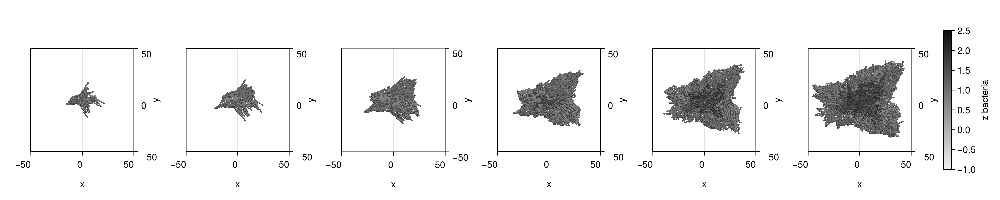

In [42]:
using JLD2

fig = Figure(size=(1500,300))

file = jldopen("simulation.jld2","r")

# obtener pasos guardados
steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))

sort!(steps)

# escoger 5 repartidos
# js = round.(Int, range(last(steps)*0.9, last(steps), length=5))
js=steps[50:10:end]

for (i,j) in enumerate(js)

    params = file["step_$j"]

    ax = Axis3(fig[1,i],
        azimuth = 3π/2,
        elevation = π/2,
        zlabelvisible=false,
        zticklabelsvisible=false,
        zgridvisible=false,
        zspinesvisible=false,
        aspect=(1,1,0.5)
    )

    plotAgents3D_auto!(
        ax,
        params["x"],
        params["y"],
        params["z"],
        params["d"],
        params["l"],
        params["theta"],
        params["phi"],
        params["z"],
        colormap=Reverse(:grays),
        colorrange=(-1,2.5),
    )

    xlims!(-50,50)
    ylims!(-50,50)
    zlims!(-10,10)

end

Colorbar(fig[1,length(js)+1],
    colormap=Reverse(:grays),
    colorrange=(-1,2.5),
    label="z bacteria"
)

save("NonPushing_z.png",fig; dpi=900)

display(fig)

close(file)

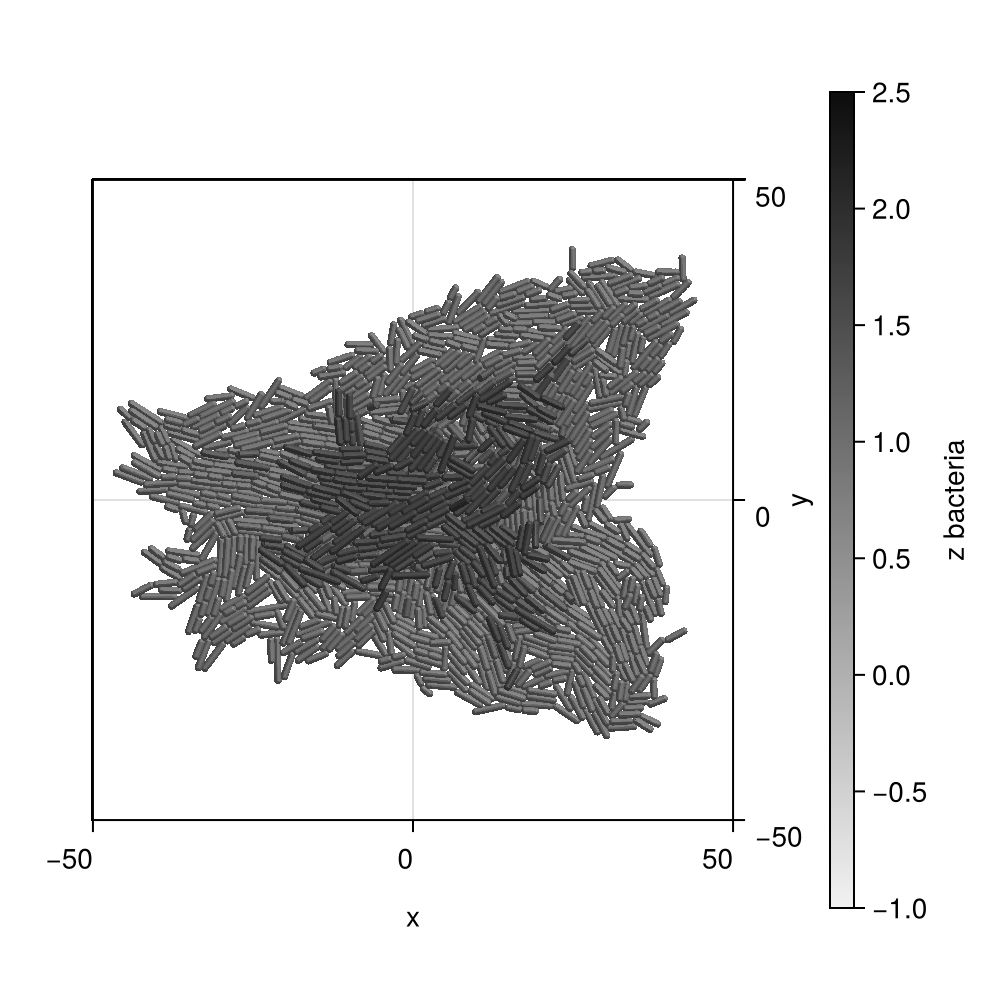

In [43]:
using JLD2

fig = Figure(size=(500,500))

file = jldopen("simulation.jld2","r")

# obtener pasos guardados
steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
last_step = maximum(steps)

params = file["step_$last_step"]

ax = Axis3(fig[1,1],
    azimuth = 3π/2,
    elevation = π/2,
    zlabelvisible=false,
    zticklabelsvisible=false,
    zgridvisible=false,
    zspinesvisible=false,
    aspect=(1,1,0.5)
)

plotAgents3D_auto!(
    ax,
    params["x"],
    params["y"],
    params["z"],
    params["d"],
    params["l"],
    params["theta"],
    params["phi"],
    params["z"],
    colorrange=(-1,2.5),
    colormap=Reverse(:grays)
)

xlims!(-50,50)
ylims!(-50,50)
zlims!(-10,10)

Colorbar(fig[1,2],
    colormap=Reverse(:grays),
    colorrange=(-1,2.5),
    label="z bacteria"
)

display(fig)

close(file)

In [37]:
# fig = Figure(size=(500,500))
# com_load, times = load_parameters_log(file)
# # azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# # elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
# js= length(com_load)
# for (i,j) in enumerate(js)
#     println(i, j)
#     ax = Axis3(fig[1,i],
#                 azimuth=3*π/2,
#                 elevation=π/2,
#                 zlabelvisible=false,
#                 zticklabelsvisible=false,
#                 zgridvisible=false,
#                 zspinesvisible=false,
#                 aspect = (1,1,0.5)
#             )

#     plotAgents3D_auto!(
#     ax,
#     com_load[j][:x],
#     com_load[j][:y],
#     com_load[j][:z],
#     com_load[j][:d],
#     com_load[j][:l],
#     com_load[j][:theta],
#     com_load[j][:phi],
#     com_load[j][:z],
#     colorrange = (0, 3),
#     colormap = :viridis
# )

#     xlims!(-50,50)
#     ylims!(-50,50)
#     zlims!(-10,10)
# end
# Colorbar(fig[1, length(js) + 1],
#     colormap = :viridis,
#     colorrange =(0,3),
#     label = "z bacteria"
# )

# display(fig)

In [38]:
import Pkg; Pkg.add("Images")

   Resolving package versions...
  No Changes to `C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM\Project.toml`
  No Changes to `C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM\Manifest.toml`


In [39]:
# using CairoMakie: Axis
# using Images, ImageMorphology
# using Statistics

# # ============================
# # 1) Datos de entrada
# # ============================
# frame = com_load[end]   # o com_load[j] si quieres otro tiempo

# xs = frame[:x]
# ys = frame[:y]
# ls = frame[:l]
# ts = frame[:theta]
# ps = frame[:phi]

# # ============================
# # 2) Parámetros de rasterización
# # ============================
# px = 0.5                     # tamaño de píxel en unidades de tu simulación
# xmin, xmax = -100.0, 100.0
# ymin, ymax = -100.0, 100.0

# nx = Int(cld(xmax - xmin, px))
# ny = Int(cld(ymax - ymin, px))

# # Máscara binaria (filas ~ y, columnas ~ x)
# mask = falses(ny, nx)

# Δs_eff = 0.2 * px  # paso a lo largo del rod

# for (x0, y0, l, theta, phi) in zip(xs, ys, ls, ts, ps)
#     ux = cos(theta) * cos(phi)   # dirección 2D
#     uy = sin(theta) * cos(phi)

#     K = max(2, ceil(Int, l / Δs_eff))
#     for s in LinRange(-l/2, l/2, K)
#         xp = x0 + s * ux
#         yp = y0 + s * uy

#         # mapeo a grid (x,y) -> (j,i)
#         j = clamp(Int(floor((xp - xmin)/px)) + 2, 1, nx)  # columna (x)
#         i = clamp(Int(floor((yp - ymin)/px)) + 2, 1, ny)  # fila    (y)

#         mask[i, j] = true
#     end
# end

# # ============================
# # 3) Morfología: closing
# # ============================
# cell_diam = 1.0                          # en unidades de x,y
# rpx = max(1, Int(round(cell_diam/px)))   # radio en píxeles
# K = trues(2rpx+1, 2rpx+1)

# dil  = dilate(mask, K)
# clos = erode(dil, K)   # closing clásico

# # ============================
# # 4) Rellenar huecos internos
# # ============================
# function fill_holes(mask::BitMatrix)
#     bg  = .!mask                    # fondo
#     lbl = label_components(bg)      # etiquetas de fondo

#     ny, nx = size(mask)
#     border_labels = Set{Int}()

#     # etiquetas de fondo que tocan el borde de la imagen
#     union!(border_labels, lbl[1, :])
#     union!(border_labels, lbl[end, :])
#     union!(border_labels, lbl[:, 1])
#     union!(border_labels, lbl[:, end])

#     filled = copy(mask)

#     @inbounds for i in 1:ny, j in 1:nx
#         lab = lbl[i, j]
#         if lab != 0 && !(lab in border_labels)
#             filled[i, j] = true
#         end
#     end

#     return filled
# end


# clos_filled = fill_holes(clos)

# # perímetro sobre la máscara maciza
# perim = clos_filled .& .!erode(clos_filled, trues(3,3))

# # ============================
# # 5) Centroides (área y perímetro)
# # ============================
# # Puntos del perímetro en coords reales
# Iper = findall(perim)
# @assert !isempty(Iper) "El perímetro está vacío; revisa px / límites / cell_diam"

# pxx = xmin .+ ((getindex.(Iper, 2) .- 1) .* px)  # columnas -> x
# pyy = ymin .+ ((getindex.(Iper, 1) .- 1) .* px)  # filas    -> y

# # Centroide del perímetro
# cx_perim = mean(pxx)
# cy_perim = mean(pyy)

# # Centroide del área (tipo regionprops sobre clos_filled)
# Iarea = findall(clos_filled)
# @assert !isempty(Iarea) "La máscara 'clos_filled' está vacía"

# x_area = xmin .+ ((getindex.(Iarea, 2) .- 1) .* px)
# y_area = ymin .+ ((getindex.(Iarea, 1) .- 1) .* px)
# cx_area = mean(x_area)
# cy_area = mean(y_area)

# # ============================
# # 6) Helpers de visualización
# # ============================
# to_rgba(mask_bool; fill_color = RGBA(0,0,0,0.5)) = begin
#     img = fill(RGBA(0,0,0,0), size(mask_bool)...)
#     img[mask_bool] .= fill_color
#     img
# end

# img_mask        = to_rgba(mask;        fill_color = RGBA(0,0,0,0.4))
# img_clos        = to_rgba(clos;        fill_color = RGBA(0,0,1,0.4))
# img_clos_filled = to_rgba(clos_filled; fill_color = RGBA(0,0,0,0.4))
# img_empty       = fill(RGBA(0,0,0,0), ny, nx)

# # Makie interpreta (x,y) como (col, fila) → transponemos
# img_mask_flip        = permutedims(img_mask)
# img_clos_flip        = permutedims(img_clos)
# img_clos_filled_flip = permutedims(img_clos_filled)
# img_empty_flip       = permutedims(img_empty)

# xstop = xmax
# ystop = ymax

# # ============================
# # 7) Figura con los pasos
# # ============================
# fig = Figure(resolution = (1400, 900))

# ax1 = Axis(fig[1,1], title = "1) Puntos", xlabel="x", ylabel="y", aspect=DataAspect())
# image!(ax1, xmin..xstop, ymin..ystop, img_empty_flip)
# scatter!(ax1, xs, ys; markersize=2, color=:gray)

# ax2 = Axis(fig[1,2], title = "2) Máscara inicial", xlabel="x", ylabel="y", aspect=DataAspect())
# image!(ax2, xmin..xstop, ymin..ystop, img_mask_flip)
# scatter!(ax2, xs, ys; markersize=1.5, color=:gray, transparency=true)

# ax3 = Axis(fig[1,3], title = "3) Closing", xlabel="x", ylabel="y", aspect=DataAspect())
# image!(ax3, xmin..xstop, ymin..ystop, img_clos_flip)
# scatter!(ax3, xs, ys; markersize=1.5, color=:gray, transparency=true)

# ax4 = Axis(fig[2,1], title = "4) Closing + relleno huecos", xlabel="x", ylabel="y", aspect=DataAspect())
# image!(ax4, xmin..xstop, ymin..ystop, img_clos_filled_flip)
# scatter!(ax4, xs, ys; markersize=1.5, color=:gray, transparency=true)

# ax5 = Axis(fig[2,2], title = "5) Perímetro sobre máscara maciza", xlabel="x", ylabel="y", aspect=DataAspect())
# image!(ax5, xmin..xstop, ymin..ystop, img_empty_flip)
# scatter!(ax5, pxx, pyy; markersize=4, color=:crimson, label="perímetro")
# scatter!(ax5, [cx_perim], [cy_perim]; markersize=10, color=:orange, marker=:cross, label="centroide perímetro")
# scatter!(ax5, [cx_area], [cy_area]; markersize=12, color=:green, marker=:star5, label="centroide área")
# axislegend(ax5; position=:rb)

# ax6 = Axis(fig[2,3], title = "6) Overlay final", xlabel="x", ylabel="y", aspect=DataAspect())
# image!(ax6, xmin..xstop, ymin..ystop, img_clos_filled_flip)
# scatter!(ax6, pxx, pyy; markersize=3, color=:crimson)
# scatter!(ax6, [cx_area], [cy_area]; markersize=12, color=:green, marker=:star5)

# fig
# # save("pipeline_colonia_filled.png", fig)


In [40]:
import Pkg; Pkg.add("ImageMorphology")

   Resolving package versions...
  No Changes to `C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM\Project.toml`
  No Changes to `C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM\Manifest.toml`


┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie C:\Users\julia\.julia\packages\Makie\Vn16E\src\scenes.jl:264


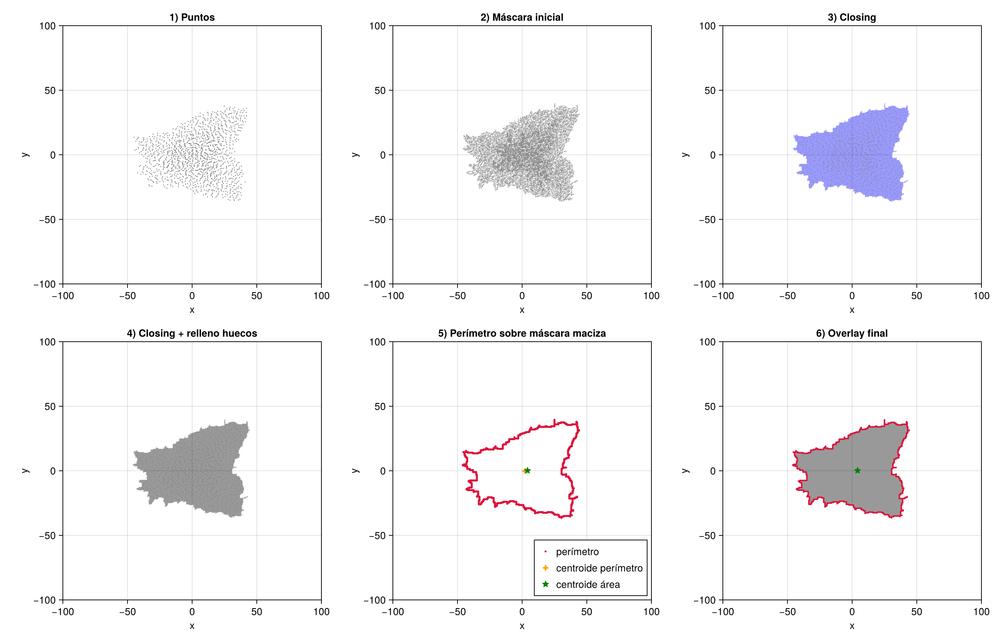

In [44]:
using CairoMakie: Axis
using Images, ImageMorphology
using Statistics
using JLD2
using CairoMakie

# ============================
# 1) Cargar último snapshot
# ============================

file = jldopen("simulation.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
last_step = maximum(steps)

frame = file["step_$last_step"]

xs = frame["x"]
ys = frame["y"]
ls = frame["l"]
ts = frame["theta"]
ps = frame["phi"]

# ============================
# 2) Parámetros de rasterización
# ============================

px = 0.5
xmin, xmax = -100.0, 100.0
ymin, ymax = -100.0, 100.0

nx = Int(cld(xmax - xmin, px))
ny = Int(cld(ymax - ymin, px))

mask = falses(ny, nx)

Δs_eff = 0.2 * px

for (x0, y0, l, theta, phi) in zip(xs, ys, ls, ts, ps)

    ux = cos(theta) * cos(phi)
    uy = sin(theta) * cos(phi)

    K = max(2, ceil(Int, l / Δs_eff))

    for s in LinRange(-l/2, l/2, K)

        xp = x0 + s * ux
        yp = y0 + s * uy

        j = clamp(Int(floor((xp - xmin)/px)) + 2, 1, nx)
        i = clamp(Int(floor((yp - ymin)/px)) + 2, 1, ny)

        mask[i, j] = true

    end
end

# ============================
# 3) Morfología: closing
# ============================

cell_diam = 1.0
rpx = max(1, Int(round(cell_diam/px)))

K = trues(2rpx+1, 2rpx+1)

dil  = dilate(mask, K)
clos = erode(dil, K)

# ============================
# 4) Rellenar huecos internos
# ============================

function fill_holes(mask::BitMatrix)

    bg  = .!mask
    lbl = label_components(bg)

    ny, nx = size(mask)

    border_labels = Set{Int}()

    union!(border_labels, lbl[1, :])
    union!(border_labels, lbl[end, :])
    union!(border_labels, lbl[:, 1])
    union!(border_labels, lbl[:, end])

    filled = copy(mask)

    @inbounds for i in 1:ny, j in 1:nx
        lab = lbl[i, j]
        if lab != 0 && !(lab in border_labels)
            filled[i, j] = true
        end
    end

    return filled
end

clos_filled = fill_holes(clos)

# ============================
# 5) Perímetro
# ============================

perim = clos_filled .& .!erode(clos_filled, trues(3,3))

# ============================
# 6) Centroides
# ============================

Iper = findall(perim)

@assert !isempty(Iper) "El perímetro está vacío"

pxx = xmin .+ ((getindex.(Iper, 2) .- 1) .* px)
pyy = ymin .+ ((getindex.(Iper, 1) .- 1) .* px)

cx_perim = mean(pxx)
cy_perim = mean(pyy)

Iarea = findall(clos_filled)

@assert !isempty(Iarea) "La máscara está vacía"

x_area = xmin .+ ((getindex.(Iarea, 2) .- 1) .* px)
y_area = ymin .+ ((getindex.(Iarea, 1) .- 1) .* px)

cx_area = mean(x_area)
cy_area = mean(y_area)

# ============================
# 7) Helpers de visualización
# ============================

to_rgba(mask_bool; fill_color = RGBA(0,0,0,0.5)) = begin
    img = fill(RGBA(0,0,0,0), size(mask_bool)...)
    img[mask_bool] .= fill_color
    img
end

img_mask        = to_rgba(mask;        fill_color = RGBA(0,0,0,0.4))
img_clos        = to_rgba(clos;        fill_color = RGBA(0,0,1,0.4))
img_clos_filled = to_rgba(clos_filled; fill_color = RGBA(0,0,0,0.4))
img_empty       = fill(RGBA(0,0,0,0), ny, nx)

img_mask_flip        = permutedims(img_mask)
img_clos_flip        = permutedims(img_clos)
img_clos_filled_flip = permutedims(img_clos_filled)
img_empty_flip       = permutedims(img_empty)

xstop = xmax
ystop = ymax

# ============================
# 8) Figura
# ============================

fig = Figure(resolution = (1400, 900))

ax1 = Axis(fig[1,1], title = "1) Puntos", xlabel="x", ylabel="y", aspect=DataAspect())
image!(ax1, xmin..xstop, ymin..ystop, img_empty_flip)
scatter!(ax1, xs, ys; markersize=2, color=:gray)

ax2 = Axis(fig[1,2], title = "2) Máscara inicial", xlabel="x", ylabel="y", aspect=DataAspect())
image!(ax2, xmin..xstop, ymin..ystop, img_mask_flip)
scatter!(ax2, xs, ys; markersize=1.5, color=:gray, transparency=true)

ax3 = Axis(fig[1,3], title = "3) Closing", xlabel="x", ylabel="y", aspect=DataAspect())
image!(ax3, xmin..xstop, ymin..ystop, img_clos_flip)
scatter!(ax3, xs, ys; markersize=1.5, color=:gray, transparency=true)

ax4 = Axis(fig[2,1], title = "4) Closing + relleno huecos", xlabel="x", ylabel="y", aspect=DataAspect())
image!(ax4, xmin..xstop, ymin..ystop, img_clos_filled_flip)
scatter!(ax4, xs, ys; markersize=1.5, color=:gray, transparency=true)

ax5 = Axis(fig[2,2], title = "5) Perímetro sobre máscara maciza", xlabel="x", ylabel="y", aspect=DataAspect())
image!(ax5, xmin..xstop, ymin..ystop, img_empty_flip)
scatter!(ax5, pxx, pyy; markersize=4, color=:crimson, label="perímetro")
scatter!(ax5, [cx_perim], [cy_perim]; markersize=10, color=:orange, marker=:cross, label="centroide perímetro")
scatter!(ax5, [cx_area], [cy_area]; markersize=12, color=:green, marker=:star5, label="centroide área")
axislegend(ax5; position=:rb)

ax6 = Axis(fig[2,3], title = "6) Overlay final", xlabel="x", ylabel="y", aspect=DataAspect())
image!(ax6, xmin..xstop, ymin..ystop, img_clos_filled_flip)
scatter!(ax6, pxx, pyy; markersize=3, color=:crimson)
scatter!(ax6, [cx_area], [cy_area]; markersize=12, color=:green, marker=:star5)

fig

# close(file)

# save("pipeline_colonia_filled.png", fig)

In [42]:
# using Statistics
# using CairoMakie: Axis
# CairoMakie.activate!()   # solo una vez por sesión
# # display(f_cv)
# # --- elige el centroide ---
# cx, cy = cx_area, cy_area   # o cx_perim, cy_perim

# @assert !isempty(pxx) "No hay puntos de perímetro."

# # Distancias euclídeas del perímetro al centro
# d = hypot.(pxx .- cx, pyy .- cy)

# μ = mean(d)
# σ = std(d)
# cv_std_over_mean = σ / μ
# cv_mean_over_std = μ / σ

# @info "Radial asymmetry" mean=μ std=σ CV_std_over_mean=cv_std_over_mean CV_mean_over_std=cv_mean_over_std

# # ================================
# # FIGURA DEL CV
# # ================================
# f_cv = Figure(resolution = (1200, 420))

# # --- Histograma de distancias ---
# axh = Axis(f_cv[1,1],
#     title = "Distancias al centro (N=$(length(d))) · CV=σ/μ=$(round(cv_std_over_mean, digits=3))",
#     xlabel = "distancia r",
#     ylabel = "densidad"
# )
# hist!(axh, d; bins = max(20, cld(length(d),10)), normalization = :pdf, label="Distancias")
# vlines!(axh, [μ]; color = :red, linewidth = 2, label="Media r")
# axislegend(axh; position=:rt)

# # --- Perfil angular ---
# θ = atan.(pyy .- cy, pxx .- cx)

# axp = Axis(f_cv[1,2],
#     title = "Perfil radial por ángulo",
#     xlabel = "θ (rad)",
#     ylabel = "r",
# )

# scatter!(axp, θ, d; markersize = 2, color = :gray, label="Perímetro")

# # ✅ cálculo de r medio por sectores angulares
# nbinsθ = 360
# edges = range(-π, π; length = nbinsθ+1)
# θ_cent = similar(edges, nbinsθ)
# r_mean = similar(edges, nbinsθ)

# for k in 1:nbinsθ
#     sel = (θ .>= edges[k]) .& (θ .< edges[k+1])
#     vals = d[sel]
#     r_mean[k] = isempty(vals) ? NaN : mean(vals)
#     θ_cent[k] = (edges[k] + edges[k+1]) / 2
# end

# lines!(axp, θ_cent, r_mean; linewidth = 2, color = :blue, label="r medio")
# axislegend(axp; position=:rt)

# display(f_cv)

# println("Media r = $μ")
# println("Std r   = $σ")
# println("CV (σ/μ) = $cv_std_over_mean   ← estándar")
# println("CV (μ/σ) = $cv_mean_over_std   ← como lo planteaste")


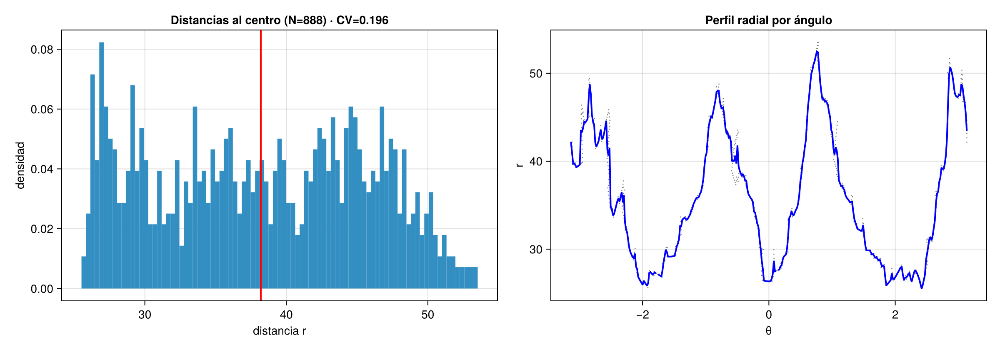

┌ Info: Radial asymmetry
│   mean = 38.19505288327998
│   std = 7.501198418072394
│   CV = 0.19639188459812476
└ @ Main c:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM\proves\Pushing\Clean\nopushing\jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_Y165sZmlsZQ==.jl:143
┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie C:\Users\julia\.julia\packages\Makie\Vn16E\src\scenes.jl:264


Media r = 38.19505288327998
Std r   = 7.501198418072394
CV (σ/μ) = 0.19639188459812476
CV (μ/σ) = 5.091860094149473


In [45]:
using Statistics
using CairoMakie
using JLD2

CairoMakie.activate!()

# ============================
# 1) cargar último snapshot
# ============================

file = jldopen("simulation.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
last_step = maximum(steps)

frame = file["step_$last_step"]

xs = frame["x"]
ys = frame["y"]
ls = frame["l"]
ts = frame["theta"]
ps = frame["phi"]

# ============================
# 2) rasterización
# ============================

px = 0.5
xmin, xmax = -100.0, 100.0
ymin, ymax = -100.0, 100.0

nx = Int(cld(xmax-xmin,px))
ny = Int(cld(ymax-ymin,px))

mask = falses(ny,nx)

Δs_eff = 0.2px

for (x0,y0,l,θ,φ) in zip(xs,ys,ls,ts,ps)

    ux = cos(θ)*cos(φ)
    uy = sin(θ)*cos(φ)

    K = max(2,ceil(Int,l/Δs_eff))

    for s in LinRange(-l/2,l/2,K)

        xp = x0 + s*ux
        yp = y0 + s*uy

        j = clamp(Int(floor((xp-xmin)/px))+2,1,nx)
        i = clamp(Int(floor((yp-ymin)/px))+2,1,ny)

        mask[i,j] = true
    end
end

# ============================
# 3) closing morfológico
# ============================

using ImageMorphology

cell_diam = 1.0
rpx = max(1,Int(round(cell_diam/px)))

K = trues(2rpx+1,2rpx+1)

dil = dilate(mask,K)
clos = erode(dil,K)

# ============================
# 4) rellenar huecos
# ============================

using Images

function fill_holes(mask::BitMatrix)

    bg = .!mask
    lbl = label_components(bg)

    ny,nx = size(mask)

    border_labels = Set{Int}()

    union!(border_labels,lbl[1,:])
    union!(border_labels,lbl[end,:])
    union!(border_labels,lbl[:,1])
    union!(border_labels,lbl[:,end])

    filled = copy(mask)

    for i in 1:ny, j in 1:nx
        lab = lbl[i,j]
        if lab != 0 && !(lab in border_labels)
            filled[i,j] = true
        end
    end

    return filled
end

clos_filled = fill_holes(clos)

# ============================
# 5) perímetro
# ============================

perim = clos_filled .& .!erode(clos_filled,trues(3,3))

Iper = findall(perim)

pxx = xmin .+ ((getindex.(Iper,2).-1).*px)
pyy = ymin .+ ((getindex.(Iper,1).-1).*px)

# ============================
# 6) centroide área
# ============================

Iarea = findall(clos_filled)

x_area = xmin .+ ((getindex.(Iarea,2).-1).*px)
y_area = ymin .+ ((getindex.(Iarea,1).-1).*px)

cx_area = mean(x_area)
cy_area = mean(y_area)

cx,cy = cx_area,cy_area

# ============================
# 7) distancias radiales
# ============================

d = hypot.(pxx .- cx, pyy .- cy)

μ = mean(d)
σ = std(d)

cv_std_over_mean = σ/μ
cv_mean_over_std = μ/σ

@info "Radial asymmetry" mean=μ std=σ CV=cv_std_over_mean

# ============================
# 8) figura CV
# ============================

f_cv = Figure(resolution=(1200,420))

# histograma

axh = Axis(f_cv[1,1],
    title="Distancias al centro (N=$(length(d))) · CV=$(round(cv_std_over_mean,digits=3))",
    xlabel="distancia r",
    ylabel="densidad")

hist!(axh,d;
    bins=max(20,cld(length(d),10)),
    normalization=:pdf)

vlines!(axh,[μ],color=:red,linewidth=2)

# perfil angular

θ = atan.(pyy.-cy,pxx.-cx)

axp = Axis(f_cv[1,2],
    title="Perfil radial por ángulo",
    xlabel="θ",
    ylabel="r")

scatter!(axp,θ,d;
    markersize=2,
    color=:gray)

nbinsθ = 360

edges = range(-π,π,length=nbinsθ+1)

θ_cent = similar(edges,nbinsθ)
r_mean = similar(edges,nbinsθ)

for k in 1:nbinsθ

    sel = (θ .>= edges[k]) .& (θ .< edges[k+1])

    vals = d[sel]

    r_mean[k] = isempty(vals) ? NaN : mean(vals)

    θ_cent[k] = (edges[k]+edges[k+1])/2
end

lines!(axp,θ_cent,r_mean;
    linewidth=2,
    color=:blue)

display(f_cv)

println("Media r = $μ")
println("Std r   = $σ")
println("CV (σ/μ) = $cv_std_over_mean")
println("CV (μ/σ) = $cv_mean_over_std")

close(file)

In [46]:
using Images
using ImageMorphology
using Statistics
using CairoMakie

# ============================================================
# Rellena huecos internos de una máscara binaria
# (agujeros = fondo que NO toca el borde)
# ============================================================
function fill_holes(mask::AbstractMatrix{Bool})
    bg  = .!mask
    lbl = label_components(bg)

    ny, nx = size(mask)
    border_labels = Set{Int}()

    # etiquetas del fondo que tocan los bordes
    union!(border_labels, lbl[1, :])
    union!(border_labels, lbl[end, :])
    union!(border_labels, lbl[:, 1])
    union!(border_labels, lbl[:, end])

    filled = copy(mask)

    @inbounds for i in 1:ny, j in 1:nx
        lab = lbl[i, j]
        if lab != 0 && !(lab in border_labels)
            filled[i, j] = true
        end
    end

    return filled
end

"""
    colony_perimeter_centroid_cv(frame; px=0.5, bounds=nothing,
                                 cell_diam=2.0, sample_step=0.2)

Dado un `frame = com_load[j]` que contenga `:x, :y, :l, :theta, :phi`,
rasteriza rods, hace máscara binaria, closing, relleno de huecos, obtiene perímetro,
centroide del área y CV radial (σ/μ).

Retorna un NamedTuple con:
- perim_x::Vector{Float64}, perim_y::Vector{Float64}
- cx::Float64, cy::Float64
- cv::Float64, mu::Float64, sigma::Float64
- mask, clos, clos_filled, perim (para debug)
- bounds=(xmin,xmax,ymin,ymax), px
"""
function colony_perimeter_centroid_cv(frame; px=0.5, bounds=nothing,
                                      cell_diam=2.0, sample_step=0.2)

    xs = frame[:x]; ys = frame[:y]
    ls = frame[:l]; ts = frame[:theta]; ps = frame[:phi]

    # ----- límites -----
    if bounds === nothing
        xmin = minimum(xs); xmax = maximum(xs)
        ymin = minimum(ys); ymax = maximum(ys)
        pad = max(3px, 3.0)
        xmin -= pad; xmax += pad; ymin -= pad; ymax += pad
    else
        xmin, xmax, ymin, ymax = bounds
    end

    nx = Int(cld(xmax - xmin, px))
    ny = Int(cld(ymax - ymin, px))

    # ----- rasterización -----
    mask = falses(ny, nx)  # (fila=y, col=x)
    Δs = sample_step * px

    for (x0, y0, l, theta, phi) in zip(xs, ys, ls, ts, ps)
        ux = cos(theta) * cos(phi)
        uy = sin(theta) * cos(phi)

        K = max(2, ceil(Int, l / Δs))
        @inbounds for s in LinRange(-l/2, l/2, K)
            xp = x0 + s*ux
            yp = y0 + s*uy

            j = clamp(Int(floor((xp - xmin)/px)) + 1, 1, nx)
            i = clamp(Int(floor((yp - ymin)/px)) + 1, 1, ny)

            mask[i, j] = true
        end
    end

    # ----- closing + fill holes -----
    rpx = max(1, Int(round((cell_diam/2)/px)))   # radio en píxeles
    K = trues(2rpx+1, 2rpx+1)

    dil  = dilate(mask, K)
    clos = erode(dil, K)
    clos_filled = fill_holes(clos)

    # perímetro
    perim = clos_filled .& .!erode(clos_filled, trues(3,3))

    # ----- centroide (área) -----
    Iarea = findall(clos_filled)
    @assert !isempty(Iarea) "Máscara vacía; revisa px/bounds/cell_diam."

    x_area = xmin .+ ((getindex.(Iarea, 2) .- 1) .* px)
    y_area = ymin .+ ((getindex.(Iarea, 1) .- 1) .* px)
    cx = mean(x_area)
    cy = mean(y_area)

    # ----- perímetro en coords -----
    Iper = findall(perim)
    @assert !isempty(Iper) "Perímetro vacío; revisa px/bounds/cell_diam."

    perim_x = xmin .+ ((getindex.(Iper, 2) .- 1) .* px)
    perim_y = ymin .+ ((getindex.(Iper, 1) .- 1) .* px)

    # ordenar por ángulo para tener contorno "recorrible"
    ang = atan.(perim_y .- cy, perim_x .- cx)
    ord = sortperm(ang)
    perim_x = perim_x[ord]
    perim_y = perim_y[ord]

    # ----- CV radial -----
    d = hypot.(perim_x .- cx, perim_y .- cy)
    μ = mean(d)
    σ = std(d)
    cv = σ / μ

    return (perim_x=perim_x, perim_y=perim_y,
            cx=cx, cy=cy, cv=cv, mu=μ, sigma=σ,
            mask=mask, clos=clos, clos_filled=clos_filled, perim=perim,
            bounds=(xmin, xmax, ymin, ymax), px=px)
end

"""
    plot_colony_perimeter!(ax, res; show_points=false, close_loop=true)

Dibuja contorno (línea), centroide y opcionalmente puntos.
`res` es el NamedTuple devuelto por `colony_perimeter_centroid_cv`.
"""
function plot_colony_perimeter!(ax, res; show_points=false, close_loop=true)
    x = res.perim_x
    y = res.perim_y

    if close_loop && !isempty(x)
        x = vcat(x, x[1])
        y = vcat(y, y[1])
    end

    lines!(ax, x, y; color=:crimson, linewidth=2, label="perímetro")
    scatter!(ax, [res.cx], [res.cy]; color=:green, marker=:star5, markersize=14, label="centroide")

    if show_points
        scatter!(ax, res.perim_x, res.perim_y; color=:gray, markersize=2, label="pts borde")
    end

    axislegend(ax; position=:rb)
    return ax
end

# ============================================================
# MINI-DEMO (coméntala si no quieres que se ejecute)
# ============================================================
# frame = com_load[end]
# res = colony_perimeter_centroid_cv(frame; px=0.5, cell_diam=2.0)
# @info "CV radial" cv=res.cv mu=res.mu sigma=res.sigma
#
# fig = Figure(resolution=(700, 600))
# ax = Axis(fig[1,1]; xlabel="x", ylabel="y", aspect=DataAspect(),
#           title="Perímetro + centroide (CV=$(round(res.cv, digits=3)))")
# plot_colony_perimeter!(ax, res; show_points=false)
# xlims!(ax, res.bounds[1], res.bounds[2])
# ylims!(ax, res.bounds[3], res.bounds[4])
# display(fig)

plot_colony_perimeter!

In [47]:
# using Images, ImageMorphology
# using Statistics

# # Rellena huecos internos de una máscara binaria
# function fill_holes(mask::BitMatrix)
#     bg  = .!mask                    # fondo
#     lbl = label_components(bg)      # etiquetas de fondo

#     ny, nx = size(mask)
#     border_labels = Set{Int}()

#     # etiquetas de fondo que tocan el borde de la imagen
#     union!(border_labels, lbl[1, :])
#     union!(border_labels, lbl[end, :])
#     union!(border_labels, lbl[:, 1])
#     union!(border_labels, lbl[:, end])

#     filled = copy(mask)

#     @inbounds for i in 1:ny, j in 1:nx
#         lab = lbl[i, j]
#         # agujero interno = fondo que no toca borde
#         if lab != 0 && !(lab in border_labels)
#             filled[i, j] = true
#         end
#     end

#     return filled
# end

# """
#     colony_perimeter_centroid_cv(frame; px=0.5, bounds=nothing,
#                                  cell_diam=2.0, sample_step=0.2)

# Dado un `frame = com_load[j]` que contenga `:x, :y, :l, :theta, :phi`,
# rasteriza los rods, calcula la máscara, su perímetro (sobre máscara sin huecos),
# el centroide del área y el CV radial (σ/μ).

# Retorna un NamedTuple con:
# - perim_x::Vector{Float64}, perim_y::Vector{Float64}
# - cx::Float64, cy::Float64
# - cv::Float64, mu::Float64, sigma::Float64
# - mask, clos, clos_filled, perim (por si quieres debug)
# """
# function colony_perimeter_centroid_cv(frame; px=0.5, bounds=nothing,
#                                       cell_diam=2.0, sample_step=0.2)

#     xs = frame[:x]; ys = frame[:y]
#     ls = frame[:l]; ts = frame[:theta]; ps = frame[:phi]

#     # ----- límites -----
#     if bounds === nothing
#         xmin = minimum(xs); xmax = maximum(xs)
#         ymin = minimum(ys); ymax = maximum(ys)
#         pad = max(3px, 3.0)
#         xmin -= pad; xmax += pad; ymin -= pad; ymax += pad
#     else
#         xmin, xmax, ymin, ymax = bounds
#     end
#     nx = Int(cld(xmax - xmin, px))
#     ny = Int(cld(ymax - ymin, px))

#     # ----- rasterización a máscara -----
#     mask = falses(ny, nx)           # (fila=y, col=x)
#     Δs = sample_step * px

#     for (x0, y0, l, theta, phi) in zip(xs, ys, ls, ts, ps)
#         ux = cos(theta) * cos(phi)
#         uy = sin(theta) * cos(phi)  # proyección 2D
#         K = max(2, ceil(Int, l / Δs))
#         @inbounds for s in LinRange(-l/2, l/2, K)
#             xp = x0 + s*ux
#             yp = y0 + s*uy
#             j = clamp(Int(floor((xp - xmin)/px)) + 1, 1, nx)  # columna (x)
#             i = clamp(Int(floor((yp - ymin)/px)) + 1, 1, ny)  # fila (y)
#             mask[i, j] = true
#         end
#     end

#     # ----- morfología: closing + rellenar huecos -----
#     rpx = max(1, Int(round(cell_diam/px/2)))
#     K = trues(2rpx+1, 2rpx+1)
#     dil  = dilate(mask, K)
#     clos = erode(dil, K)                # closing
#     clos_filled = fill_holes(clos)      # relleno de agujeros internos

#     # perímetro sobre máscara maciza
#     perim = clos_filled .& .!erode(clos_filled, trues(3,3))

#     # ----- centroide del área (tipo regionprops sobre clos_filled) -----
#     Iarea = findall(clos_filled)
#     @assert !isempty(Iarea) "Máscara vacía; revisa px/bounds/cell_diam."
#     x_area = xmin .+ ((getindex.(Iarea, 2) .- 1) .* px)  # columnas -> x
#     y_area = ymin .+ ((getindex.(Iarea, 1) .- 1) .* px)  # filas    -> y
#     cx = mean(x_area); cy = mean(y_area)

#     # ----- perímetro en coordenadas -----
#     Iper = findall(perim)
#     @assert !isempty(Iper) "Perímetro vacío; revisa px/bounds/cell_diam."
#     perim_x = xmin .+ ((getindex.(Iper, 2) .- 1) .* px)
#     perim_y = ymin .+ ((getindex.(Iper, 1) .- 1) .* px)

#     # ordenar perímetro por ángulo alrededor del centroide (para pintar línea suave)
#     θ = atan.(perim_y .- cy, perim_x .- cx)
#     ord = sortperm(θ)
#     perim_x = perim_x[ord]
#     perim_y = perim_y[ord]

#     # ----- CV radial (σ/μ) -----
#     d = hypot.(perim_x .- cx, perim_y .- cy)
#     μ = mean(d); σ = std(d)
#     cv = σ / μ

#     return (perim_x=perim_x, perim_y=perim_y,
#             cx=cx, cy=cy, cv=cv, mu=μ, sigma=σ,
#             mask=mask, clos=clos, clos_filled=clos_filled, perim=perim,
#             bounds=(xmin, xmax, ymin, ymax), px=px)
# end


# """
#     plot_colony_perimeter!(ax, res; show_points=false)

# Pinta la periferia como línea, marca el centroide, y opcionalmente puntos del borde.
# `res` es el NamedTuple devuelto por `colony_perimeter_centroid_cv`.
# """
# function plot_colony_perimeter!(ax, res; show_points=false)
#     scatter!(ax, res.perim_x, res.perim_y; color=:crimson, markersize=2, label="periferia")
#     scatter!(ax, [res.cx], [res.cy]; color=:green, marker=:star5, markersize=12, label="centroide")
#     if show_points
#         scatter!(ax, res.perim_x, res.perim_y; color=:gray, markersize=2, label="borde (pts)")
#     end
#     axislegend(ax; position=:rb)
#     return ax
# end


In [48]:
# # ejemplo con el último frame:
# res = colony_perimeter_centroid_cv(com_load[end]; px=0.2,
#                                    bounds=(-100,100,-100,100),
#                                    cell_diam=2.5, sample_step=0.01)

# println("Centroide = ($(res.cx), $(res.cy))")
# println("CV radial (σ/μ) = $(res.cv)   (μ=$(res.mu), σ=$(res.sigma))")

# fig = Figure(resolution=(700,600))
# ax  = Axis(fig[1,1]; title="Perímetro y centroide", xlabel="x", ylabel="y", aspect=DataAspect())
# plot_colony_perimeter!(ax, res; show_points=false)
# display(fig)
# # save("colonia_perimetro.png", fig)


In [49]:
using JLD2
using CairoMakie

CairoMakie.activate!()

# ============================
# cargar último snapshot
# ============================

file = jldopen("simulation.jld2","r")

# obtener pasos disponibles
steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
last_step = maximum(steps)

println("Cargando snapshot step_$last_step")

frame = file["step_$last_step"]

# ============================
# calcular perímetro
# ============================

res = colony_perimeter_centroid_cv(frame;
    px = 0.2,
    bounds = (-100,100,-100,100),
    cell_diam = 2.5,
    sample_step = 0.01
)

println("Centroide = ($(res.cx), $(res.cy))")
println("CV radial (σ/μ) = $(res.cv)   (μ=$(res.mu), σ=$(res.sigma))")

# ============================
# figura
# ============================

fig = Figure(resolution = (700,600))

ax = Axis(fig[1,1];
    title = "Perímetro y centroide",
    xlabel = "x",
    ylabel = "y",
    aspect = DataAspect()
)

plot_colony_perimeter!(ax, res; show_points=false)

# ajustar límites automáticamente
xmin,xmax,ymin,ymax = res.bounds
xlims!(ax, xmin, xmax)
ylims!(ax, ymin, ymax)

display(fig)

close(file)

# save("colonia_perimetro.png", fig)

Cargando snapshot step_100000


MethodError: MethodError: no method matching getindex(::JLD2.Group{JLD2.JLDFile{JLD2.MmapIO}}, ::Symbol)

Closest candidates are:
  getindex(::JLD2.Group, !Matched::AbstractString)
   @ JLD2 C:\Users\julia\.julia\packages\JLD2\ws7Qu\src\groups.jl:87


In [52]:
# ===============================
# Suavizado circular
# ===============================

function smooth_circular(x, w)

    n = length(x)
    y = similar(x)

    hw = div(w,2)

    for i in 1:n

        s = 0.0
        c = 0

        for k in -hw:hw
            j = mod1(i+k, n)
            s += x[j]
            c += 1
        end

        y[i] = s/c

    end

    return y

end


# ===============================
# Perímetro + centroide + CV
# ===============================

function colony_perimeter_centroid_cv(frame; px=0.5, bounds=nothing,
                                      cell_diam=2.0, sample_step=0.2,
                                      smooth_window=20)

    # compatible con Dict o JLD2.Group
    getf(frame,k) = try frame[k] catch; frame[Symbol(k)] end

    xs = getf(frame,"x")
    ys = getf(frame,"y")
    ls = getf(frame,"l")
    ts = getf(frame,"theta")
    ps = getf(frame,"phi")

    # ===============================
    # límites
    # ===============================

    if bounds === nothing

        xmin = minimum(xs); xmax = maximum(xs)
        ymin = minimum(ys); ymax = maximum(ys)

        pad = max(3px,3.0)

        xmin -= pad
        xmax += pad
        ymin -= pad
        ymax += pad

    else

        xmin,xmax,ymin,ymax = bounds

    end

    nx = Int(cld(xmax-xmin,px))
    ny = Int(cld(ymax-ymin,px))

    # ===============================
    # rasterización
    # ===============================

    mask = falses(ny,nx)

    Δs = sample_step * px

    for (x0,y0,l,θ,φ) in zip(xs,ys,ls,ts,ps)

        ux = cos(θ)*cos(φ)
        uy = sin(θ)*cos(φ)

        K = max(2,ceil(Int,l/Δs))

        @inbounds for s in LinRange(-l/2,l/2,K)

            xp = x0 + s*ux
            yp = y0 + s*uy

            j = clamp(Int(floor((xp-xmin)/px))+1,1,nx)
            i = clamp(Int(floor((yp-ymin)/px))+1,1,ny)

            mask[i,j] = true

        end

    end

    # ===============================
    # morfología
    # ===============================

    rpx = max(1,Int(round((cell_diam/2)/px)))

    K = trues(2rpx+1,2rpx+1)

    dil  = dilate(mask,K)
    clos = erode(dil,K)

    clos_filled = fill_holes(clos)

    perim = clos_filled .& .!erode(clos_filled,trues(3,3))

    # ===============================
    # centroide
    # ===============================

    Iarea = findall(clos_filled)

    @assert !isempty(Iarea) "Máscara vacía; revisa px/bounds/cell_diam."

    x_area = xmin .+ ((getindex.(Iarea,2).-1).*px)
    y_area = ymin .+ ((getindex.(Iarea,1).-1).*px)

    cx = mean(x_area)
    cy = mean(y_area)

    # ===============================
    # perímetro
    # ===============================

    Iper = findall(perim)

    @assert !isempty(Iper) "Perímetro vacío; revisa px/bounds/cell_diam."

    perim_x = xmin .+ ((getindex.(Iper,2).-1).*px)
    perim_y = ymin .+ ((getindex.(Iper,1).-1).*px)

    θ = atan.(perim_y .- cy, perim_x .- cx)

    ord = sortperm(θ)

    perim_x = perim_x[ord]
    perim_y = perim_y[ord]
    θ = θ[ord]

    # ===============================
    # 🔹 suavizado radial
    # ===============================

    r = hypot.(perim_x .- cx, perim_y .- cy)

    r_s = smooth_circular(r, smooth_window)

    perim_x = cx .+ r_s .* cos.(θ)
    perim_y = cy .+ r_s .* sin.(θ)

    # ===============================
    # CV radial
    # ===============================

    d = hypot.(perim_x .- cx, perim_y .- cy)

    μ = mean(d)
    σ = std(d)

    cv = σ/μ

    # ===============================
    # área y densidad
    # ===============================

    area_px = count(clos_filled)

    area_um2 = area_px * px^2

    N = length(xs)

    density = N / area_um2

    return (perim_x=perim_x,perim_y=perim_y,
            cx=cx,cy=cy,cv=cv,mu=μ,sigma=σ,
            mask=mask,clos=clos,clos_filled=clos_filled,perim=perim,
            bounds=(xmin,xmax,ymin,ymax),px=px,
            area_px=area_px,area_um2=area_um2,
            N=N,density=density)

end

colony_perimeter_centroid_cv (generic function with 1 method)

In [53]:
steps[10:10:end]

10-element Vector{Int64}:
  9000
 19000
 29000
 39000
 49000
 59000
 69000
 79000
 89000
 99000

In [55]:
js=steps[50:10:end]

6-element Vector{Int64}:
 49000
 59000
 69000
 79000
 89000
 99000

In [71]:
# import Pkg; Pkg.add("ColorSchemes")

   Resolving package versions...
    Updating `C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM\Project.toml`
  [35d6a980] + ColorSchemes v3.31.0
  No Changes to `C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM\Manifest.toml`


In [83]:
using CairoMakie

parula = cgrad([
    RGBf(0.2081,0.1663,0.5292),
    RGBf(0.2116,0.1898,0.5777),
    RGBf(0.2123,0.2138,0.6270),
    RGBf(0.2081,0.2386,0.6771),
    RGBf(0.1959,0.2645,0.7279),
    RGBf(0.1707,0.2919,0.7792),
    RGBf(0.1253,0.3242,0.8303),
    RGBf(0.0591,0.3598,0.8683),
    RGBf(0.0117,0.3875,0.8820),
    RGBf(0.0060,0.4086,0.8828),
    RGBf(0.0165,0.4266,0.8786),
    RGBf(0.0329,0.4430,0.8720),
    RGBf(0.0498,0.4586,0.8641),
    RGBf(0.0629,0.4737,0.8554),
    RGBf(0.0723,0.4887,0.8467),
    RGBf(0.0779,0.5040,0.8384),
    RGBf(0.0793,0.5200,0.8312),
    RGBf(0.0749,0.5375,0.8263),
    RGBf(0.0641,0.5570,0.8240),
    RGBf(0.0488,0.5772,0.8228),
    RGBf(0.0343,0.5966,0.8199),
    RGBf(0.0265,0.6137,0.8135),
    RGBf(0.0239,0.6287,0.8038),
    RGBf(0.0231,0.6418,0.7913),
    RGBf(0.0228,0.6535,0.7768),
    RGBf(0.0267,0.6642,0.7607),
    RGBf(0.0384,0.6743,0.7436),
    RGBf(0.0590,0.6838,0.7254),
    RGBf(0.0843,0.6928,0.7062),
    RGBf(0.1133,0.7015,0.6859),
    RGBf(0.1453,0.7098,0.6646),
    RGBf(0.1801,0.7177,0.6424),
    RGBf(0.2178,0.7250,0.6193),
    RGBf(0.2586,0.7317,0.5954),
    RGBf(0.3022,0.7376,0.5712),
    RGBf(0.3482,0.7424,0.5473),
    RGBf(0.3953,0.7459,0.5244),
    RGBf(0.4420,0.7481,0.5033),
    RGBf(0.4871,0.7491,0.4840),
    RGBf(0.5300,0.7491,0.4661),
    RGBf(0.5709,0.7485,0.4494),
    RGBf(0.6099,0.7473,0.4337),
    RGBf(0.6473,0.7456,0.4188),
    RGBf(0.6834,0.7435,0.4044),
    RGBf(0.7184,0.7411,0.3905),
    RGBf(0.7525,0.7384,0.3768),
    RGBf(0.7858,0.7356,0.3633),
    # RGBf(0.8185,0.7327,0.3498),
    # RGBf(0.8507,0.7299,0.3360),
    # RGBf(0.8824,0.7274,0.3217),
    # RGBf(0.9139,0.7258,0.3063),
    # RGBf(0.9450,0.7261,0.2886),
    # RGBf(0.9739,0.7314,0.2666),
    # RGBf(0.9938,0.7455,0.2403),
    # RGBf(0.9990,0.7653,0.2164),
    # RGBf(0.9955,0.7861,0.1967),
    # RGBf(0.9880,0.8066,0.1794),
    # RGBf(0.9789,0.8271,0.1633),
    # RGBf(0.9697,0.8481,0.1475),
    # RGBf(0.9626,0.8705,0.1309),
    # RGBf(0.9589,0.8949,0.1132),
    # RGBf(0.9598,0.9218,0.0948),
    # RGBf(0.9661,0.9514,0.0755),
    # RGBf(0.9763,0.9831,0.0538)
])

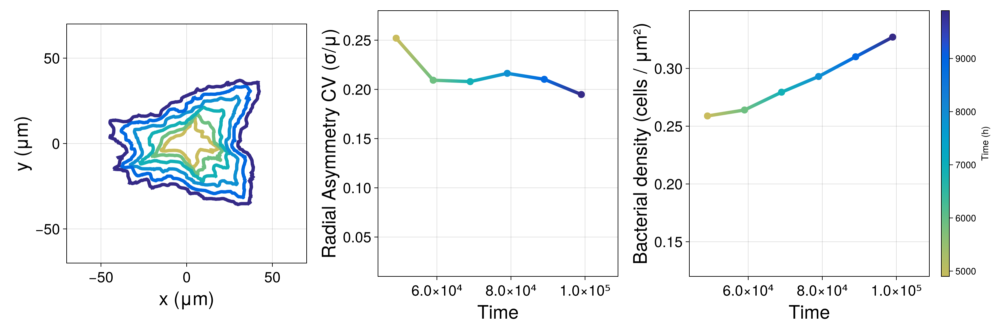

┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie C:\Users\julia\.julia\packages\Makie\Vn16E\src\scenes.jl:264


In [91]:
using CairoMakie
using ColorSchemes


CairoMakie.activate!()

fig = Figure(resolution = (1500, 500))

file = jldopen("simulation.jld2","r")

# elegir subconjunto representativo
# js = round.(Int, range(first(steps), last(steps), length = 30))
js=steps[50:10:end]
# js=steps[1:end]

ax1 = Axis(fig[1,1];
    xlabel = "x (μm)",
    ylabel = "y (μm)",
    aspect = DataAspect(),
    xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22
)

ax2 = Axis(fig[1,2];
    xlabel = "Time",
    ylabel = "Radial Asymmetry CV (σ/μ)",
    xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22
)

ax3 = Axis(fig[1,3];
    xlabel = "Time",
    ylabel = "Bacterial density (cells / μm²)",
    xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22
)

limits!(ax1, -70, 70, -70, 70)
limits!(ax2,  js[1]*0.9, js[end]*1.1, 0.01, 0.28)
limits!(ax3,  js[1]*0.9, js[end]*1.1, 0.12, 0.35)

cols = resample_cmap(Reverse(parula), length(js))

cvs = Float64[]
densities = Float64[]

for (i, step) in enumerate(js)

    frame = file["step_$step"]

    res = colony_perimeter_centroid_cv(
        frame;
        px = 0.2,
        bounds = (-100,100,-100,100),
        cell_diam = 2.5,
        sample_step = 0.01
    )

    push!(cvs, res.cv)
    push!(densities, res.density)

    scatterlines!(ax1, res.perim_x, res.perim_y;
        color = cols[i],
        linewidth = 5,
        markersize = 3
    )
end

scatterlines!(ax2, js, cvs;
    color = cols,
    linewidth = 5,
    markersize = 15
)

scatterlines!(ax3, js, densities;
    color = cols,
    linewidth = 5,
    markersize = 15
)

Colorbar(fig[1,4];
    colormap = Reverse(parula),
    limits = (js[1]/10, js[end]/10),
    label = "Time (h)"
)

save("NonPushing_anal.svg", fig)
display(fig)

close(file)

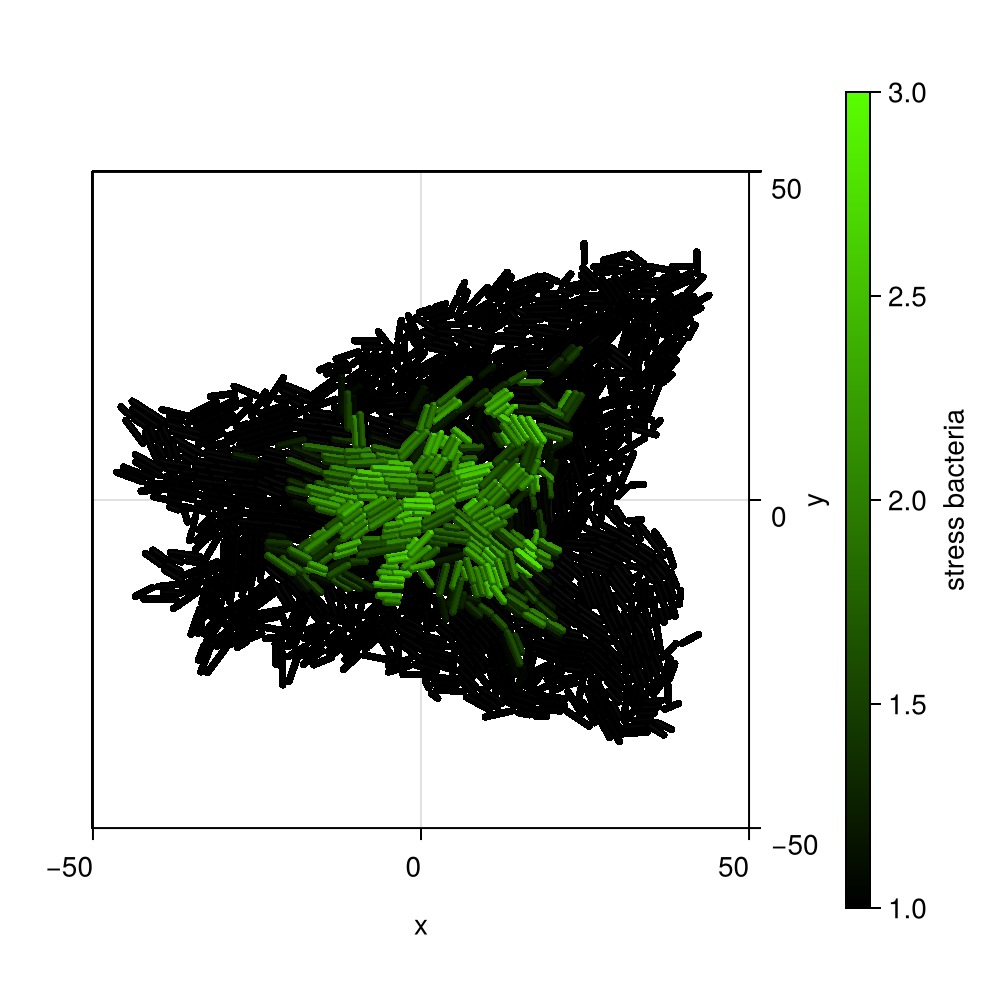

In [ ]:
using CairoMakie
using JLD2

CairoMakie.activate!()

fig = Figure(size=(500,500))

file = jldopen("simulation.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
last_step = maximum(steps)

frame = file["step_$last_step"]

ax = Axis3(fig[1,1],
    azimuth = 3π/2,
    elevation = π/2,
    zlabelvisible=false,
    zticklabelsvisible=false,
    zgridvisible=false,
    zspinesvisible=false,
    aspect = (1,1,0.5)
)

plotAgents3D_auto!(
    ax,
    frame["x"],
    frame["y"],
    -frame["z"],
    frame["d"],
    frame["l"],
    frame["theta"],
    frame["phi"],
    frame["V"],
    colorrange = (1,3),
    colormap  = cgrad([:black, "#59FF00"]),
)

xlims!(-50,50)
ylims!(-50,50)
zlims!(-10,10)

Colorbar(fig[1,2],
    colormap = cgrad([:black, "#59FF00"]),
    colorrange = (1,3),
    label = "stress bacteria"
)

display(fig)

close(file)

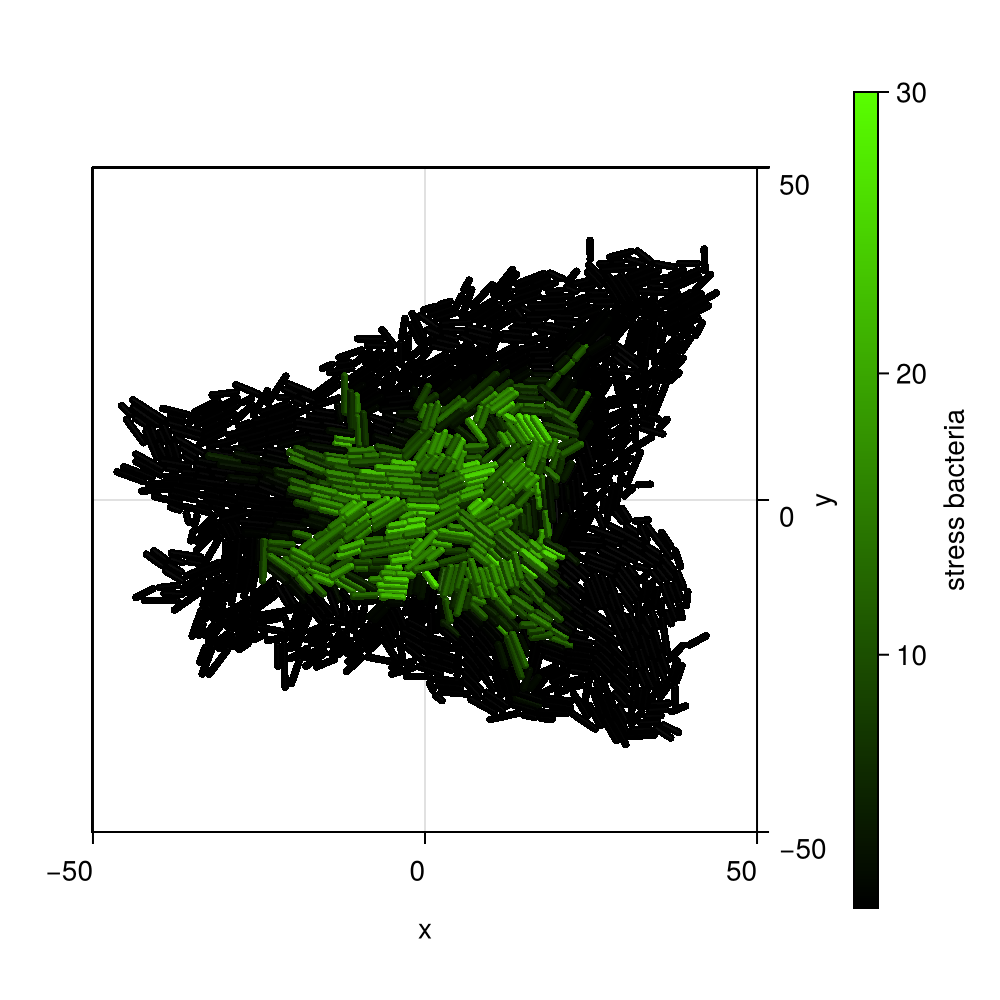

In [72]:
using CairoMakie
using JLD2

CairoMakie.activate!()

fig = Figure(size=(500,500))

file = jldopen("simulation.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
last_step = maximum(steps)

frame = file["step_$last_step"]

# =========================
# índices en la malla HPad
# =========================

ix = clamp.(round.(Int, frame["x"] .+ 100) .+ 1, 1, size(frame["HPad"],2))
iy = clamp.(round.(Int, frame["y"] .+ 100) .+ 1, 1, size(frame["HPad"],1))

HP = frame["HPad"][CartesianIndex.(ix,iy)]

# campo coloreado
stress = exp.(4 .* (HP .- frame["z"] .- frame["d"]/2)) 

# =========================
# plot
# =========================

ax = Axis3(fig[1,1],
    azimuth = 3π/2,
    elevation = π/2,
    zlabelvisible=false,
    zticklabelsvisible=false,
    zgridvisible=false,
    zspinesvisible=false,
    aspect = (1,1,0.5)
)

plotAgents3D_auto!(
    ax,
    frame["x"],
    frame["y"],
    -frame["z"],
    frame["d"],
    frame["l"],
    frame["theta"],
    frame["phi"],
    stress,
    colorrange = (1,30),
    colormap = cgrad([:black, "#59FF00"]),
)

xlims!(-50,50)
ylims!(-50,50)
zlims!(-10,10)

Colorbar(fig[1,2],
    colormap = cgrad([:black, "#59FF00"]),
    colorrange = (1,30),
    label = "stress bacteria"
)

display(fig)

close(file)

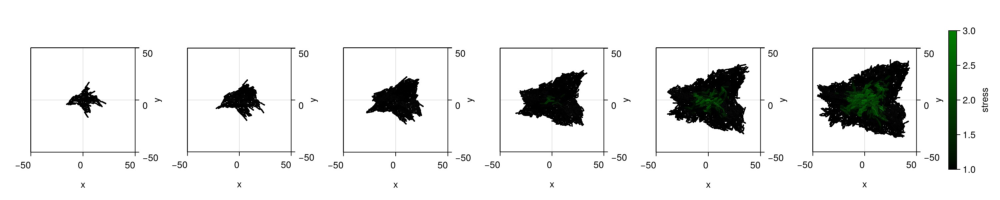

In [58]:
using CairoMakie
using JLD2

CairoMakie.activate!()

fig = Figure(size=(1500,300))

file = jldopen("simulation.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

idx = steps[50:10:end]

for (i, step) in enumerate(idx)

    frame = file["step_$step"]

    ax = Axis3(fig[1,i],
        azimuth = 3π/2,
        elevation = π/2,
        zlabelvisible=false,
        zticklabelsvisible=false,
        zgridvisible=false,
        zspinesvisible=false,
        aspect = (1,1,0.5)
    )

    plotAgents3D_auto!(
        ax,
        frame["x"],
        frame["y"],
        -frame["z"],
        frame["d"],
        frame["l"],
        frame["theta"],
        frame["phi"],
        frame["V"],
        colorrange = (1,3),
        colormap = :linear_ternary_green_0_46_c42_n256
    )

    xlims!(-50,50)
    ylims!(-50,50)
    zlims!(-10,10)

end

Colorbar(fig[1, length(idx)+1],
    colormap = :linear_ternary_green_0_46_c42_n256,
    colorrange = (1,3),
    label = "stress"
)

save("NonPushing_V.png", fig; dpi=1500)

display(fig)

close(file)

In [82]:
# fig = Figure(size=(1500,300))
# com_load, times = load_parameters_log(file)
# # azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# # elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
# js= round.(Int, range(50, 92, length=5))
# for (i,j) in enumerate(js)

#     ax = Axis3(fig[1,i],
#                 azimuth=3*π/2,
#                 elevation=-π/2,
#                 zlabelvisible=false,
#                 zticklabelsvisible=false,
#                 zgridvisible=false,
#                 zspinesvisible=false,
#                 aspect = (1,1,0.5)
#             )

#     plotAgents3D_auto!(
#     ax,
#     com_load[j][:x],
#     com_load[j][:y],
#     com_load[j][:z],
#     com_load[j][:d],
#     com_load[j][:l],
#     com_load[j][:theta],
#     com_load[j][:phi],
#     com_load[j][:V],
#     colorrange = (0, 4),
#     colormap = Reverse(:inferno)
# )

#     xlims!(-50,50)
#     ylims!(50,-50)
#     zlims!(-10,10)
# end
# Colorbar(fig[1, length(js) + 1],
#     colormap = Reverse(:inferno),
#     colorrange =(0,4),
#     label = "stress"
# )

# save("NonPushing_V.png", fig; dpi=1500)
# display(fig)

In [93]:
# fig = Figure(size=(1500,300))
# com_load, times = load_parameters_log(file)
# # azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# # elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
# js= round.(Int, range(50, 92, length=5))
# for (i,j) in enumerate(js)

#     ax = Axis3(fig[1,i],
#                 azimuth=3*π/2,
#                 elevation=-π/2,
#                 zlabelvisible=false,
#                 zticklabelsvisible=false,
#                 zgridvisible=false,
#                 zspinesvisible=false,
#                 aspect = (1,1,0.5)
#             )

#     plotAgents3D_auto!(
#     ax,
#     com_load[j][:x],
#     com_load[j][:y],
#     com_load[j][:z],
#     com_load[j][:d],
#     com_load[j][:l],
#     com_load[j][:theta],
#     com_load[j][:phi],
#     com_load[j][:V],
#     colorrange = (0, 4),
#     colormap = Reverse(:inferno)
# )

#     xlims!(-50,50)
#     ylims!(50,-50)
#     zlims!(-10,10)
# end
# Colorbar(fig[1, length(js) + 1],
#     colormap = Reverse(:inferno),
#     colorrange =(0,4),
#     label = "stress"
# )

# display(fig)

In [94]:
# fig = Figure(size=(500,500))
# com_load, times = load_parameters_log(file)
# # azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# # elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
# js= length(com_load)
# for (i,j) in enumerate(js)
#     println(i, j)
#     ax = Axis3(fig[1,i],
#                 azimuth=3*π/2,
#                 elevation=-π/2,
#                 zlabelvisible=false,
#                 zticklabelsvisible=false,
#                 zgridvisible=false,
#                 zspinesvisible=false,
#                 aspect = (1,1,0.5)
#             )

#     plotAgents3D_auto!(
#     ax,
#     com_load[j][:x],
#     com_load[j][:y],
#     com_load[j][:z],
#     com_load[j][:d],
#     com_load[j][:l],
#     com_load[j][:theta],
#     com_load[j][:phi],
#     com_load[j][:V],
#     colorrange = (0, 4),
#     colormap = Reverse(:inferno)
# )

#     xlims!(-50,50)
#     ylims!(50,-50)
#     zlims!(-10,10)
# end
# Colorbar(fig[1, length(js) + 1],
#     colormap = Reverse(:inferno),
#     colorrange =(0,4),
#     label = "stress bacteria"
# )

# display(fig)

In [ ]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:solar
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:HPad]), com_load)))
colorrange_c = (0.0,  maximum(com.HPad))

fig = Figure(size=(500,500))

js =  length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.HPad)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.HPad)[2]),
            Float64.(hcat(com_load[j][:HPad][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "H Pad"
)
display(fig)

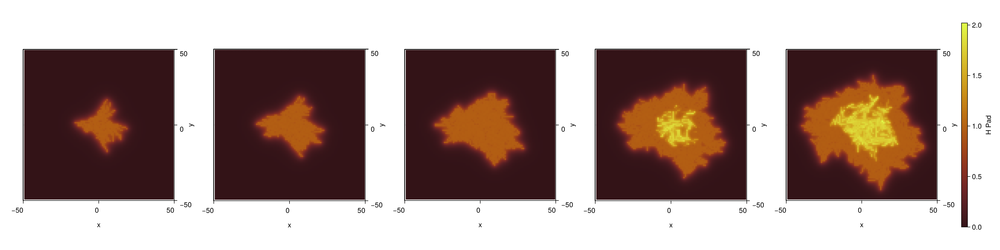

CairoMakie.Screen{IMAGE}


In [44]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)proves
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:solar
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:HPad]), com_load)))
# colorrange_c = (0.0,  maximum(maximum(maximum(p -> maximum(p[:HPad]), com_load))))
colorrange_c = (0.0,  maximum(com.HPad))

fig = Figure(size=(2000,500))

js= round.(Int, range(50, 92, length=5))

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.HPad)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.HPad)[2]),
            Float64.(hcat(com_load[j][:HPad][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "H Pad"
)
display(fig)

In [46]:
maximum(com.HPad)

2.0200631546227723

In [47]:
maximum(com.z)+com.d[1]/2

1.8974261260426621

In [48]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:summer
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrC]), com_load)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrC][1]), com_load)))

fig = Figure(size=(500,500))

js =  length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PhrC)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PhrC)[2]),
            Float64.(hcat(com_load[j][:PhrC][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PhrC"
)
display(fig)

KeyError: KeyError: key :PhrC not found

In [49]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)proves
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:summer
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrC]), com_load)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrC][1]), com_load)))

fig = Figure(size=(2000,500))

js = [1:round(Int,length(com_load)/4):length(com_load);length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PhrC)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PhrC)[2]),
            Float64.(hcat(com_load[j][:PhrC][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PhrC"
)
display(fig)

KeyError: KeyError: key :PhrC not found

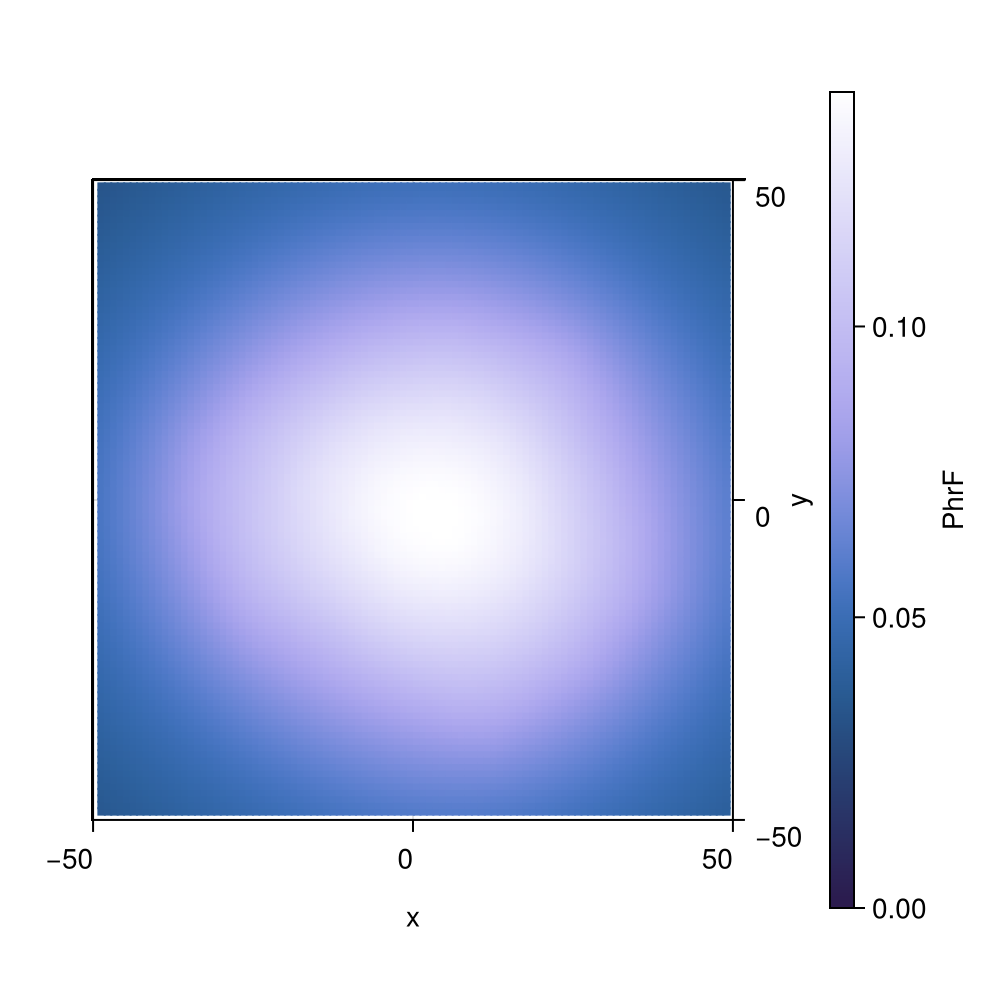

CairoMakie.Screen{IMAGE}


In [50]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:devon
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrF]), com_load)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrF][1]), com_load)))

fig = Figure(size=(500,500))

js =  length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PhrF)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PhrF)[2]),
            Float64.(hcat(com_load[j][:PhrF][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PhrF"
)
display(fig)

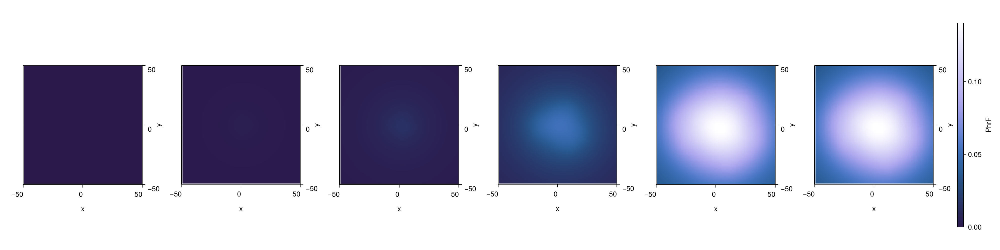

CairoMakie.Screen{IMAGE}


In [51]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)proves
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:devon
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrF]), com_load)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PhrF][1]), com_load)))

fig = Figure(size=(2000,500))

js = [1:round(Int,length(com_load)/4):length(com_load);length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PhrF)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PhrF)[2]),
            Float64.(hcat(com_load[j][:PhrF][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PhrF"
)
display(fig)

In [52]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:blues
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com_load)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA][1]), com_load)))

fig = Figure(size=(500,500))

js =  length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PGA)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PGA)[2]),
            Float64.(hcat(com_load[j][:PGA][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PGA"
)
display(fig)

ErrorException: Invalid text boundingbox GeometryBasics.HyperRectangle{3, Float64}([109.0, NaN, 0.0], [7.783999919891357, 16.309999465942383, 0.0])

In [54]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)proves
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:blues
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com_load)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA][1]), com_load)))

fig = Figure(size=(2000,500))

js = round.(Int, range(1, length(com_load), length=5))

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PGA)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PGA)[2]),
            Float64.(hcat(com_load[j][:PGA][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PGA"
)
display(fig)

ErrorException: Invalid text boundingbox GeometryBasics.HyperRectangle{3, Float64}([109.0, NaN, 0.0], [7.783999919891357, 16.309999465942383, 0.0])

In [55]:
maximum(maximum((maximum(p -> maximum(p[:PGA]), com_load))))

0.0

In [56]:
maximum(maximum((maximum(p -> maximum(p[:PPad]), com_load))))

2.045741152338225e6

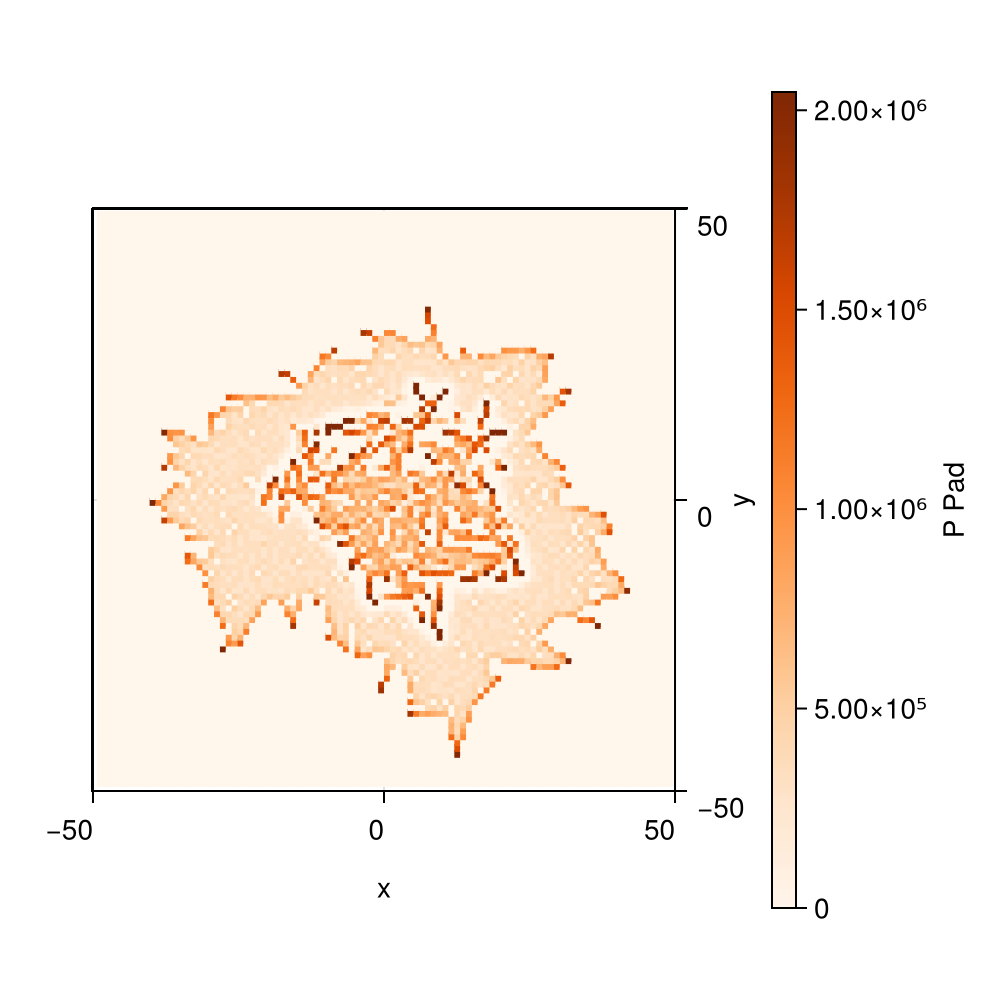

CairoMakie.Screen{IMAGE}


In [58]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:Oranges
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PPad]), com_load)))
colorrange_c = (-0.1,  maximum(maximum(p -> maximum(p[:PPad][1]), com_load)))

fig = Figure(size=(500,500))

js =  length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PPad)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PPad)[2]),
            Float64.(hcat(com_load[j][:PPad][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "P Pad"
)
display(fig)

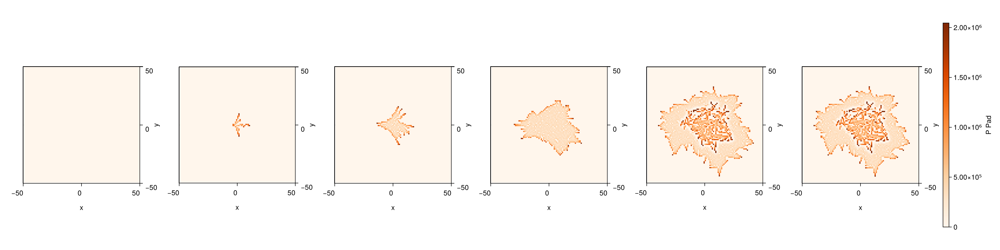

CairoMakie.Screen{IMAGE}


In [59]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:Oranges
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PPad]), com_load)))
colorrange_c = (-0.1,  maximum(maximum(p -> maximum(p[:PPad][1]), com_load)))

fig = Figure(size=(2000,500))

js = [1:round(Int,length(com_load)/4):length(com_load);length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PPad)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PPad)[2]),
            Float64.(hcat(com_load[j][:PPad][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "P Pad"
)
display(fig)

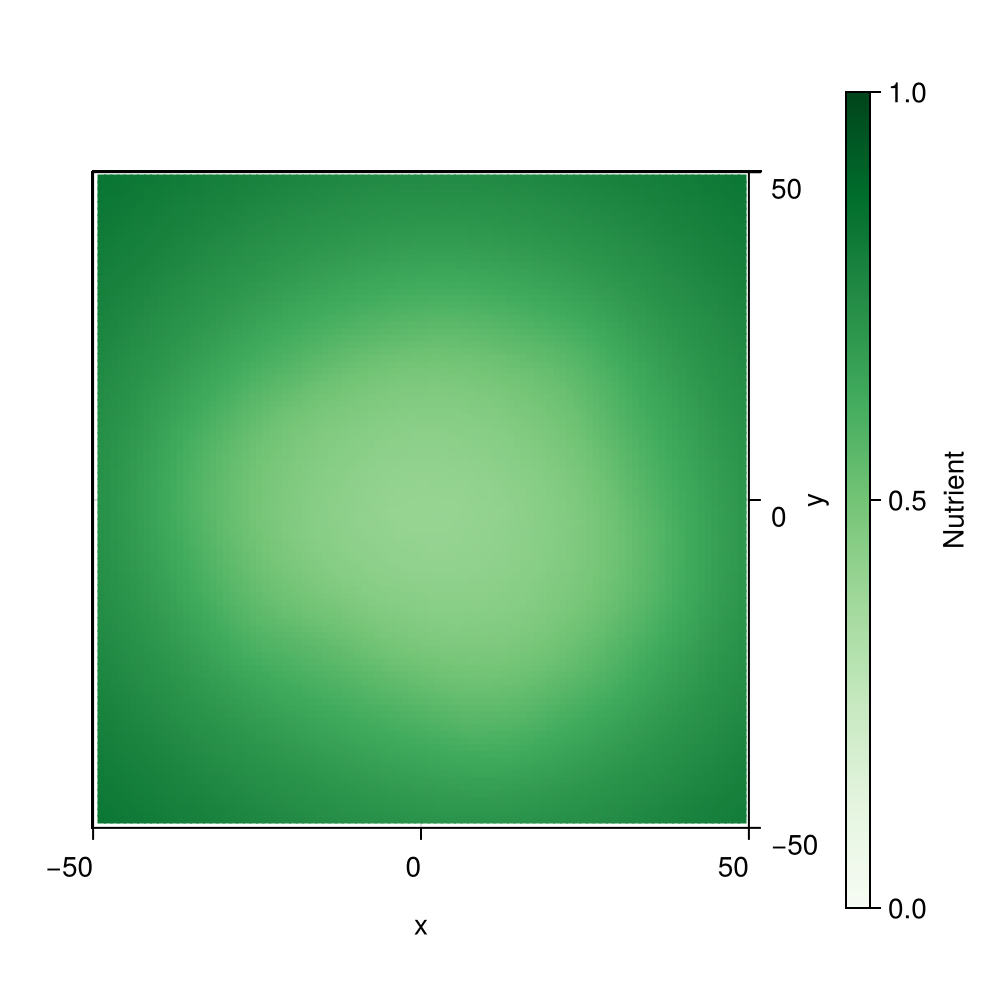

CairoMakie.Screen{IMAGE}


In [60]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:Greens
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com_load)))
colorrange_c = (0,  maximum(maximum(p -> maximum(p[:c][1]), com_load)))

fig = Figure(size=(500,500))

js =  length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[2]),
            Float64.(hcat(com_load[j][:c][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "Nutrient"
)
display(fig)

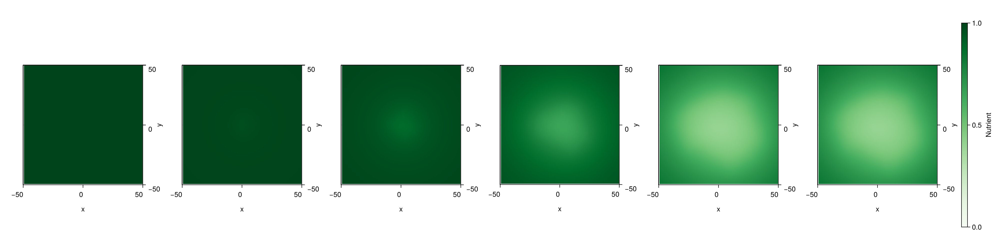

CairoMakie.Screen{IMAGE}


In [61]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:Greens
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com_load)))
colorrange_c = (0,  maximum(maximum(p -> maximum(p[:c][1]), com_load)))

fig = Figure(size=(2000,500))

js = [1:round(Int,length(com_load)/4):length(com_load);length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[2]),
            Float64.(hcat(com_load[j][:c][1]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "Nutrient"
)
display(fig)

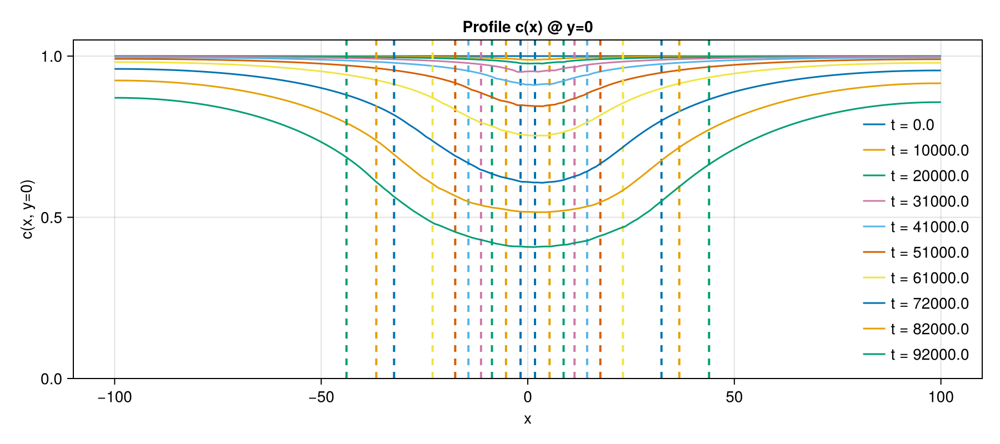

CairoMakie.Screen{IMAGE}


In [62]:
com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU
fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="c(x, y=0)", title="Profile c(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.c)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = Float64.(hcat(com_load[j][:c][1]...))
    cx = @view C[:, 100]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
ylims!(axl, 0, 1.05)
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


In [63]:
com.gamma_c[1]

5.0

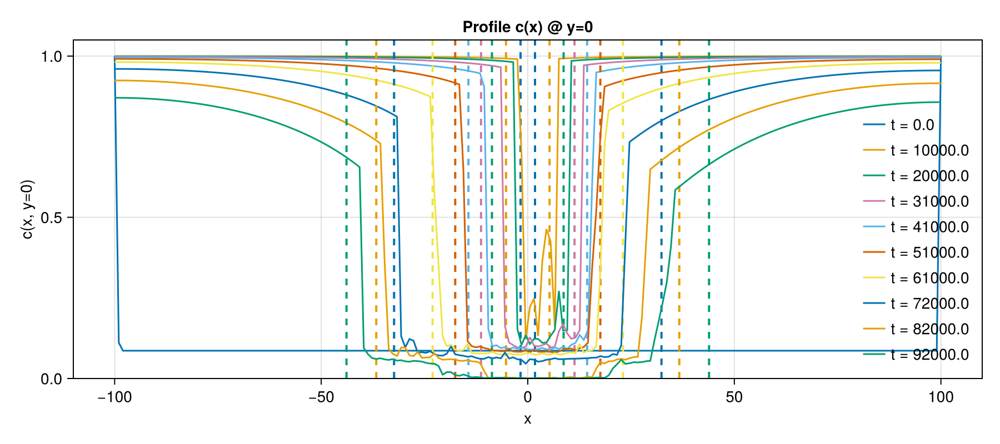

CairoMakie.Screen{IMAGE}


In [64]:
fig_line = Figure(size=(900, 400))
axl = Axis(fig_line[1,1], xlabel="x", ylabel="c(x, y=0)", title="Profile c(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.c)[1]))

# índice de columna que quieres
y_idx = 100

for (i, j) in enumerate(js)
    # matrices en la misma malla
    C = Float64.(hcat(com_load[j][:c][1]...))
    H = Float64.(hcat(com_load[j][:HPad][1]...))

    # perfiles a lo largo de x en y = y_idx
    cx = @view C[:, y_idx]
    hx = @view H[:, y_idx]

    # aplicar el factor exp(-gamma*(h - d/2)) y CAPAR por arriba en 1
    # (si prefieres también capar por abajo a 0: usa clamp.(..., 0, 1))
    cx_eff = @. cx *min(exp(-com.gamma_c[1]*(hx - com.d[1]/2)), 1)

    # traza el perfil modificado y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx_eff, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # líneas verticales con el mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],
            linestyle = :dash,
            linewidth = 2)
end

ylims!(axl, 0, 1.05)
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


In [65]:
fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="PhrC(x, y=0)", title="Profile PhrC(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.PhrC)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = Float64.(hcat(com_load[j][:PhrC][1]...))
    cx = @view C[:, 100]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


ErrorException: Parameter PhrC not found in the community.

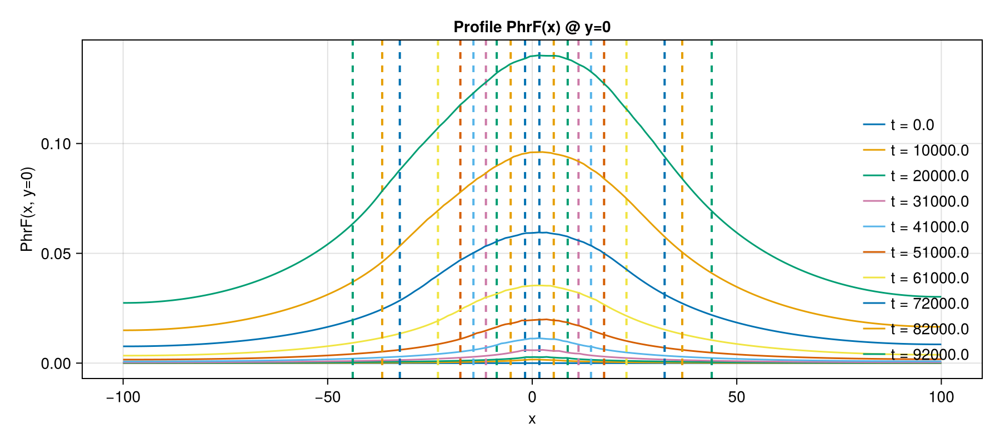

CairoMakie.Screen{IMAGE}


In [66]:
fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="PhrF(x, y=0)", title="Profile PhrF(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.PhrF)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = Float64.(hcat(com_load[j][:PhrF][1]...))
    cx = @view C[:, 100]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


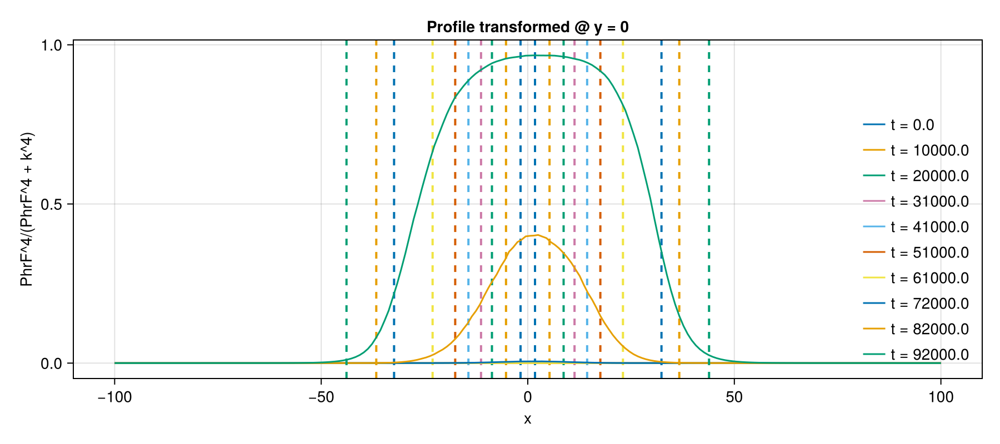

CairoMakie.Screen{IMAGE}


In [67]:
k = 0.1   # ajusta el valor que te interese
nk = 10   # ajusta el valor que te interese

fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="PhrF^4/(PhrF^4 + k^4)",
           title="Profile transformed @ y = 0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.PhrF)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración original
    C = Float64.(hcat(com_load[j][:PhrF][1]...))

    # transforma cada punto a PhrF^4/(PhrF^4 + k^4)
    Ctrans = @. C^nk / (C^nk + k^nk)

    # saca el perfil en y = 100
    cx = @view Ctrans[:, 100]

    # dibuja el perfil
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],
            linestyle = :dash,
            linewidth = 2)
end

axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


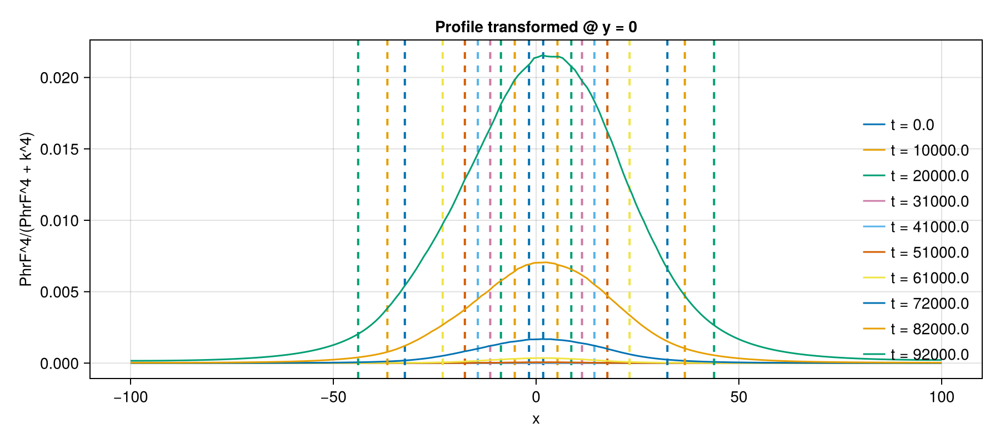

CairoMakie.Screen{IMAGE}


In [68]:
k = 0.5   # ajusta el valor que te interese
nk = 3   # ajusta el valor que te interese

fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="PhrF^4/(PhrF^4 + k^4)",
           title="Profile transformed @ y = 0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.PhrF)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración original
    C = Float64.(hcat(com_load[j][:PhrF][1]...))

    # transforma cada punto a PhrF^4/(PhrF^4 + k^4)
    Ctrans = @. C^nk / (C^nk + k^nk)

    # saca el perfil en y = 100
    cx = @view Ctrans[:, 100]

    # dibuja el perfil
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],
            linestyle = :dash,
            linewidth = 2)
end

axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


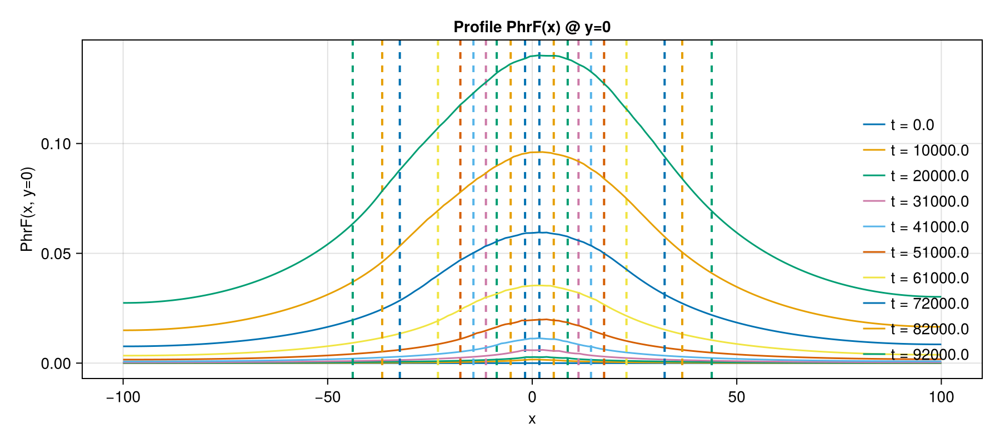

CairoMakie.Screen{IMAGE}


In [69]:
fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="PhrF(x, y=0)", title="Profile PhrF(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.PhrF)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = Float64.(hcat(com_load[j][:PhrF][1]...))
    cx = @view C[:, 100]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


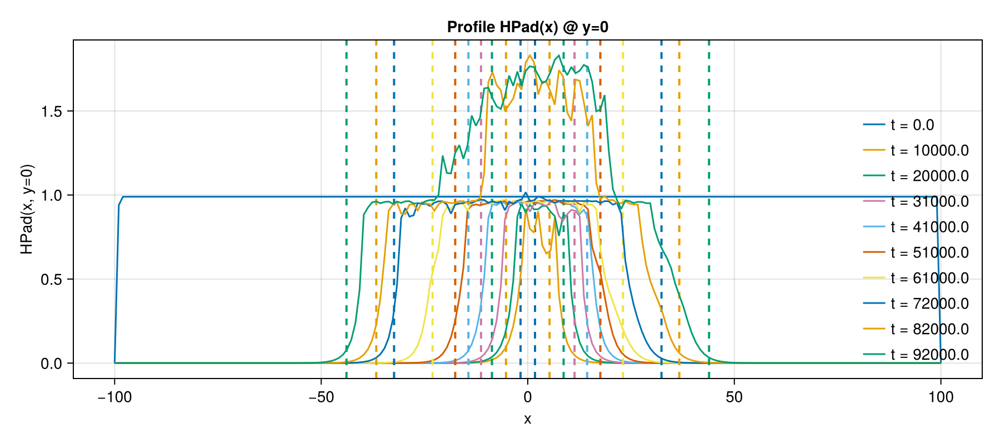

CairoMakie.Screen{IMAGE}


In [70]:
fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="HPad(x, y=0)", title="Profile HPad(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.HPad)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = Float64.(hcat(com_load[j][:HPad][1]...))
    cx = @view C[:, 100]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


In [71]:
maximum(com.z)

1.3974261260426621

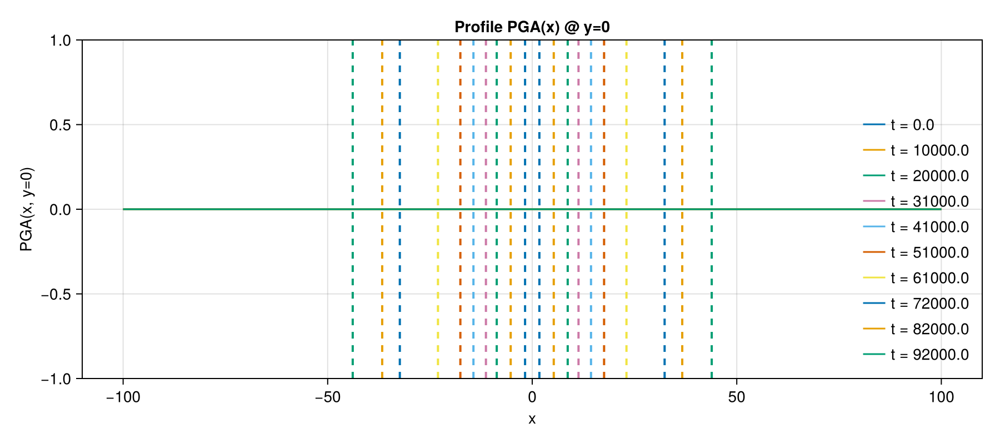

CairoMakie.Screen{IMAGE}


In [72]:
fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com_load), length=10))

axl = Axis(fig_line[1,1], xlabel="x", ylabel="PGA(x, y=0)", title="Profile PGA(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.PGA)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = Float64.(hcat(com_load[j][:PGA][1]...))
    cx = @view C[:, 100]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(times[j], sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com_load[j][:x].^2 .+ com_load[j][:y].^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


In [ ]:

# # Crear figura y ejes
# fig = Figure(size = (800, 600))
# grid = fig[1, 1] = GridLayout()
# ax1 = Axis3(grid[1, 1]; azimuth=3*π/2,
#                 elevation=π/2,
#                 zlabelvisible=false,
#                 zticklabelsvisible=false,
#                 zgridvisible=false,
#                 zspinesvisible=false,
#                 aspect = (1,1,0.1))
# ax1.xgridvisible = true
# ax1.ygridvisible = true

# Colorbar(fig[1, 2],
#     colormap = :viridis,
#     colorrange =(0,3),
#     label = "z bacteria"
# )

# Makie.record(fig, "Colony_z.mp4", 1:2:Int(length(com_load)); framerate = 10) do j
 
#     Makie.empty!(ax1)

#     plotAgents3D_auto!(
#     ax1,
#     com_load[j][:x],
#     com_load[j][:y],
#     com_load[j][:z],
#     com_load[j][:d],
#     com_load[j][:l],
#     com_load[j][:theta],
#     com_load[j][:phi],
#     com_load[j][:z],
#     colorrange = (0, 3),
#     colormap = :viridis,
# )

#     xlims!(ax1,-100,100)
#     ylims!(ax1,-100,100)
#     zlims!(ax1,-2,8)

# end




"Colony_z.mp4"

In [59]:
using CairoMakie
using JLD2

CairoMakie.activate!()

file = jldopen("simulation.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

# =========================
# figura
# =========================

fig = Figure(size = (800,600))
grid = fig[1,1] = GridLayout()

ax1 = Axis3(grid[1,1];
    azimuth = 3π/2,
    elevation = π/2,
    zlabelvisible = false,
    zticklabelsvisible = false,
    zgridvisible = false,
    zspinesvisible = false,
    aspect = (1,1,0.1)
)

ax1.xgridvisible = true
ax1.ygridvisible = true

Colorbar(fig[1,2];
    colormap = :viridis,
    colorrange = (0,3),
    label = "z bacteria"
)

# =========================
# animación
# =========================

Makie.record(fig, "Colony_z.mp4", 1:2:length(steps); framerate = 10) do i

    step = steps[i]
    frame = file["step_$step"]

    Makie.empty!(ax1)

    plotAgents3D_auto!(
        ax1,
        frame["x"],
        frame["y"],
        frame["z"],
        frame["d"],
        frame["l"],
        frame["theta"],
        frame["phi"],
        frame["z"],
        colorrange = (0,3),
        colormap = :viridis
    )

    xlims!(ax1, -100,100)
    ylims!(ax1, -100,100)
    zlims!(ax1, -2,8)

end

close(file)

In [60]:

# # Crear figura y ejes
# fig = Figure(size = (800, 600))
# grid = fig[1, 1] 
# ax1 = Axis3(grid[1, 1]; azimuth=3*π/2,
#                 elevation=-π/2,
#                 zlabelvisible=false,
#                 zticklabelsvisible=false,
#                 zgridvisible=false,
#                 zspinesvisible=false,
#                 aspect = (1,1,0.1))
# ax1.xgridvisible = true
# ax1.ygridvisible = true

# Colorbar(fig[1,2],
#     colormap = Reverse(:inferno),
#     colorrange =(0,4),
#     label = "Stress"
# )

# Makie.record(fig, "Colony_V.mp4", 1:2:Int(length(com_load)); framerate = 10) do j
 
#     Makie.empty!(ax1)

#     plotAgents3D_auto!(
#     ax1,
#     com_load[j][:x],
#     com_load[j][:y],
#     com_load[j][:z],
#     com_load[j][:d],
#     com_load[j][:l],
#     com_load[j][:theta],
#     com_load[j][:phi],
#     com_load[j][:V],
#     colorrange = (0, 4),
#     colormap = Reverse(:inferno),
# )


#     xlims!(ax1,-100,100)
#     ylims!(ax1,100,-100)
#     zlims!(ax1,-2,8)

# end


In [101]:
using CairoMakie
using JLD2

CairoMakie.activate!()

file = jldopen("simulation.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

# =========================
# figura
# =========================

fig = Figure(size = (800,600))

ax1 = Axis3(fig[1,1];
    azimuth = 3π/2,
    elevation = -π/2,
    zlabelvisible = false,
    zticklabelsvisible = false,
    zgridvisible = false,
    zspinesvisible = false,
    aspect = (1,1,0.1)
)

ax1.xgridvisible = true
ax1.ygridvisible = true

Colorbar(fig[1,2];
    colormap = cgrad([:black, "#59FF00"]),
    colorrange = (1,3),
    label = "Stress"
)

# =========================
# animación
# =========================

Makie.record(fig, "Colony_V.mp4", 1:2:length(steps); framerate = 10) do i

    step = steps[i]
    frame = file["step_$step"]

    Makie.empty!(ax1)

    plotAgents3D_auto!(
        ax1,
        frame["x"],
        frame["y"],
        frame["z"],
        frame["d"],
        frame["l"],
        frame["theta"],
        frame["phi"],
        frame["V"],
        colormap = cgrad([:black, "#59FF00"]),
        colorrange = (1,3),
    )

    xlims!(ax1, -100,100)
    ylims!(ax1, 100,-100)
    zlims!(ax1, -2,8)

end

close(file)

In [102]:
using CairoMakie
using JLD2

CairoMakie.activate!()

file = jldopen("simulation.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

# =========================
# figura
# =========================

fig = Figure(size = (800,600))

ax1 = Axis3(fig[1,1];
    azimuth = 3π/2,
    elevation = -π/2,
    zlabelvisible = false,
    zticklabelsvisible = false,
    zgridvisible = false,
    zspinesvisible = false,
    aspect = (1,1,0.1)
)

ax1.xgridvisible = true
ax1.ygridvisible = true

Colorbar(fig[1,2];
    colormap = cgrad([:black, "#59FF00"]),
    colorrange = (1,30),
    label = "Stress"
)



# =========================
# animación
# =========================

Makie.record(fig, "Colony_s.mp4", 1:2:length(steps); framerate = 10) do i

    step = steps[i]
    frame = file["step_$step"]

    ix = clamp.(round.(Int, frame["x"] .+ 100) .+ 1, 1, size(frame["HPad"],2))
    iy = clamp.(round.(Int, frame["y"] .+ 100) .+ 1, 1, size(frame["HPad"],1))

    HP = frame["HPad"][CartesianIndex.(ix,iy)]

    # campo coloreado
    stress = exp.(4 .* (HP .- frame["z"] .- frame["d"]/2)) 

    Makie.empty!(ax1)

    plotAgents3D_auto!(
        ax1,
        frame["x"],
        frame["y"],
        frame["z"],
        frame["d"],
        frame["l"],
        frame["theta"],
        frame["phi"],
        stress,
        colormap = cgrad([:black, "#59FF00"]),
        colorrange = (1,30),
    )

    xlims!(ax1, -100,100)
    ylims!(ax1, 100,-100)
    zlims!(ax1, -2,8)

end

close(file)